<a href="https://colab.research.google.com/github/BChun11/DATA3001/blob/main/EDA_Quincy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Exploratory Data Analysis

### Load Data

In [1]:
# Import required libraries
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Download data files from github
!git clone https://github.com/nokuik/KDDI-IoT-2019.git

fatal: destination path 'KDDI-IoT-2019' already exists and is not an empty directory.


In [3]:
# List all '.tar.gz files in IPFIX directory
%cd KDDI-IoT-2019
%cd ipfix
!ls *.tar.gz

/content/KDDI-IoT-2019
/content/KDDI-IoT-2019/ipfix
 amazon_echo_gen2.tar.gz		        nature_remo.tar.gz
 au_network_camera.tar.gz		        panasonic_doorphone.tar.gz
 au_wireless_adapter.tar.gz		        philips_hue_bridge.tar.gz
 bitfinder_awair_breathe_easy.tar.gz	       'planex_camera_one_shot!.tar.gz'
 candy_house_sesami_wi-fi_access_point.tar.gz   planex_smacam_outdoor.tar.gz
 irobot_roomba.tar.gz			        planex_smacam_pantilt.tar.gz
 jvc_kenwood_cu-hb1.tar.gz		        powerelectric_wi-fi_plug.tar.gz
 jvc_kenwood_hdtv_ip_camera.tar.gz	        qrio_hub.tar.gz
 line_clova_wave.tar.gz			        sony_network_camera.tar.gz
 link_japan_eremote.tar.gz		        sony_smart_speaker.tar.gz
 mouse_computer_room_hub.tar.gz		        xiaomi_mijia_led.tar.gz


In [4]:
# List all tar.gz files and store them in a variable
files = !ls -1 *.tar.gz

# Extract each tar.gz file
for file in files:
    print(f"Extract {file} ")
    !tar -xzvf {file}

Extract amazon_echo_gen2.tar.gz 
amazon_echo_gen2.json
Extract au_network_camera.tar.gz 
au_network_camera.json
Extract au_wireless_adapter.tar.gz 
au_wireless_adapter.json
Extract bitfinder_awair_breathe_easy.tar.gz 
bitfinder_awair_breathe_easy.json
Extract candy_house_sesami_wi-fi_access_point.tar.gz 
candy_house_sesami_wi-fi_access_point.json
Extract irobot_roomba.tar.gz 
irobot_roomba.json
Extract jvc_kenwood_cu-hb1.tar.gz 
jvc_kenwood_cu-hb1.json
Extract jvc_kenwood_hdtv_ip_camera.tar.gz 
jvc_kenwood_hdtv_ip_camera.json
Extract line_clova_wave.tar.gz 
line_clova_wave.json
Extract link_japan_eremote.tar.gz 
link_japan_eremote.json
Extract mouse_computer_room_hub.tar.gz 
mouse_computer_room_hub.json
Extract nature_remo.tar.gz 
nature_remo.json
Extract panasonic_doorphone.tar.gz 
panasonic_doorphone.json
Extract philips_hue_bridge.tar.gz 
philips_hue_bridge.json
Extract 'planex_camera_one_shot!.tar.gz' 
planex_camera_one_shot!.json
Extract planex_smacam_outdoor.tar.gz 
planex_smacam

In [5]:
# Print the current working directory
print("Current Working Directory:", os.getcwd())

# List the contents of the current working directory
print("Contents of Current Directory:", os.listdir())

!cd

Current Working Directory: /content/KDDI-IoT-2019/ipfix
Contents of Current Directory: ['irobot_roomba.tar.gz', 'au_network_camera.tar.gz', 'KDDI-IoT-2019', 'bitfinder_awair_breathe_easy.tar.gz', 'bitfinder_awair_breathe_easy.json', 'panasonic_doorphone.json', 'line_clova_wave.json', 'planex_camera_one_shot!.tar.gz', 'candy_house_sesami_wi-fi_access_point.tar.gz', 'amazon_echo_gen2.json', 'jvc_kenwood_hdtv_ip_camera.json', 'i-o_data_qwatch.tar.gz01', 'qrio_hub.tar.gz', 'jvc_kenwood_hdtv_ip_camera.tar.gz', 'sony_bravia.tar.gz00', 'link_japan_eremote.json', 'candy_house_sesami_wi-fi_access_point.json', 'nature_remo.json', 'jvc_kenwood_cu-hb1.json', 'xiaomi_mijia_led.json', 'powerelectric_wi-fi_plug.tar.gz', 'nature_remo.tar.gz', 'line_clova_wave.tar.gz', 'irobot_roomba.json', 'google_home_gen1.tar.gz00', 'sony_bravia.tar.gz01', 'sony_smart_speaker.json', 'sony_bravia.tar.gz02', 'xiaomi_mijia_led.tar.gz', 'sony_smart_speaker.tar.gz', 'google_home_gen1.tar.gz01', 'qrio_hub.json', 'au_wirel

In [6]:
# Code to generate distinct tables for each json file using a limited subset

# Define the directory where the JSON files are located
json_directory = '/content/KDDI-IoT-2019/ipfix'

# Get the list of all JSON files in the directory
json_files = [f for f in os.listdir(json_directory) if f.endswith('.json')]

# Create distinct tables for each json file
tables = {}
for json_file in json_files:
    # strip .json suffix from device names
    device_name = json_file.split('.')[0]
    # Construct the full path to the JSON file
    json_path = os.path.join(json_directory, json_file)

    # Read the JSON file into a DataFrame, normalize the 'flows' column
    df = pd.json_normalize(pd.read_json(json_path, lines=True, nrows=100000)['flows'])

    # Label the DataFrame with the device name
    df['Device'] = device_name
    tables[device_name] = df

# Concatenate all the Dataframes in the tables dictionary into a single Dataframe
df = pd.concat(tables.values(), ignore_index=True)
df.head()


,flowStartMilliseconds,flowEndMilliseconds,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,protocolIdentifier,sourceIPv4Address,sourceTransportPort,packetTotalCount,octetTotalCount,flowAttributes,...,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket,Device
0,2019-06-25 08:36:43.604,2019-06-25 08:36:44.183,0.579,0.0,17.0,192.168.1.1,58236.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
1,2019-06-25 08:37:46.290,2019-06-25 08:37:46.869,0.579,0.0,17.0,192.168.1.1,41504.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2,2019-06-25 08:38:49.028,2019-06-25 08:38:49.612,0.584,0.0,17.0,192.168.1.1,39296.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
3,2019-06-25 08:39:51.485,2019-06-25 08:39:52.041,0.556,0.0,17.0,192.168.1.1,43927.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
4,2019-06-25 08:40:54.527,2019-06-25 08:40:55.082,0.555,0.0,17.0,192.168.1.1,41295.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy


In [7]:
df['flowStartMilliseconds'] = pd.to_datetime(df['flowStartMilliseconds'])
df['flowEndMilliseconds'] = pd.to_datetime(df['flowEndMilliseconds'])
df.head()

,flowStartMilliseconds,flowEndMilliseconds,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,protocolIdentifier,sourceIPv4Address,sourceTransportPort,packetTotalCount,octetTotalCount,flowAttributes,...,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket,Device
0,2019-06-25 08:36:43.604,2019-06-25 08:36:44.183,0.579,0.0,17.0,192.168.1.1,58236.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
1,2019-06-25 08:37:46.290,2019-06-25 08:37:46.869,0.579,0.0,17.0,192.168.1.1,41504.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2,2019-06-25 08:38:49.028,2019-06-25 08:38:49.612,0.584,0.0,17.0,192.168.1.1,39296.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
3,2019-06-25 08:39:51.485,2019-06-25 08:39:52.041,0.556,0.0,17.0,192.168.1.1,43927.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
4,2019-06-25 08:40:54.527,2019-06-25 08:40:55.082,0.555,0.0,17.0,192.168.1.1,41295.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy


### Summary Statistics

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2116934 entries, 0 to 2116933
Data columns (total 55 columns):
 #   Column                                    Dtype         
---  ------                                    -----         
 0   flowStartMilliseconds                     datetime64[ns]
 1   flowEndMilliseconds                       datetime64[ns]
 2   flowDurationMilliseconds                  float64       
 3   reverseFlowDeltaMilliseconds              float64       
 4   protocolIdentifier                        float64       
 5   sourceIPv4Address                         object        
 6   sourceTransportPort                       float64       
 7   packetTotalCount                          float64       
 8   octetTotalCount                           float64       
 9   flowAttributes                            object        
 10  sourceMacAddress                          object        
 11  destinationIPv4Address                    object        
 12  destinationTra

In [9]:
len(df)

2116934

In [10]:
df.describe()

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,protocolIdentifier,sourceTransportPort,packetTotalCount,octetTotalCount,destinationTransportPort,reversePacketTotalCount,reverseOctetTotalCount,ingressInterface,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2116932.0,...,472317.000000,472317.000000,4.723170e+05,4.723170e+05,472317.000000,472317.000000,472317.000000,472317.000000,472317.000000,467399.000000
mean,1.063329e+02,2.601260e-01,1.538097e+01,4.302034e+04,1.016359e+01,2.208289e+03,3.000320e+03,2.956512e+00,6.105864e+02,0.0,...,2.678968,8.756591,2.245903e+03,6.298330e+03,282.538200,3.840186,350.056464,97.533574,6102.754601,219.643397
std,4.084431e+02,1.538833e+01,4.204529e+00,1.460943e+04,2.223989e+02,1.088478e+05,1.056439e+04,1.696022e+02,6.473752e+04,0.0,...,54.366085,358.097033,1.292469e+05,2.457769e+04,440.686973,123.837814,514.873490,213.374147,21845.183084,262.706791
min,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,2.800000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.0,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000
25%,1.400000e-02,0.000000e+00,1.700000e+01,3.749000e+04,1.000000e+00,1.520000e+02,8.000000e+01,0.000000e+00,0.000000e+00,0.0,...,0.000000,1.000000,5.200000e+01,0.000000e+00,48.000000,0.000000,52.000000,0.000000,0.000000,52.000000
50%,5.750000e-01,0.000000e+00,1.700000e+01,4.554400e+04,2.000000e+00,1.560000e+02,1.370000e+02,0.000000e+00,0.000000e+00,0.0,...,0.000000,1.000000,1.110000e+02,0.000000e+00,88.000000,0.000000,88.000000,0.000000,0.000000,88.000000
75%,5.990000e-01,0.000000e+00,1.700000e+01,5.327300e+04,2.000000e+00,1.560000e+02,1.370000e+02,0.000000e+00,0.000000e+00,0.0,...,1.000000,4.000000,1.057000e+03,1.460000e+02,258.000000,1.000000,270.000000,0.000000,126.000000,270.000000
max,1.800000e+03,1.760908e+03,5.800000e+01,6.553500e+04,1.890940e+05,7.676654e+07,6.553200e+04,1.677870e+05,7.947505e+07,0.0,...,35956.000000,167787.000000,7.521228e+07,1.782669e+06,3296.000000,71025.000000,4280.000000,1313.000000,153008.000000,2298.000000


### Unique Values

In [11]:
## Find the unique features (ProtocolIdentifer, destinationTransportPor, vlanId, flowAttributes, collectorname, observationDomainID) for each device
uniq_df = df[['protocolIdentifier', 'destinationTransportPort', 'vlanId', 'flowAttributes', 'Device', 'collectorName', 'observationDomainId', 'silkAppLabel', 'ipClassOfService', 'flowEndReason']]

uniq_df.groupby('Device').agg(lambda x: sorted(list(x.unique()))).reset_index()

<ipython-input-11-0400ce70bcf0>:4: FutureWarning: ['vlanId', 'flowAttributes', 'collectorName', 'ipClassOfService', 'flowEndReason'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.
  uniq_df.groupby('Device').agg(lambda x: sorted(list(x.unique()))).reset_index()


,Device,protocolIdentifier,destinationTransportPort,observationDomainId,silkAppLabel
0,amazon_echo_gen2,"[1.0, 6.0, 17.0, 58.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 80.0, 123.0, 137.0...",[0.0],[0.0]
1,au_network_camera,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 68.0, 80.0, 123.0,...",[0.0],[0.0]
2,au_wireless_adapter,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 80.0, 137.0, 161.0...",[0.0],[0.0]
3,bitfinder_awair_breathe_easy,"[1.0, 6.0, 17.0]","[0.0, 1.0, 53.0, 67.0, 137.0, 161.0, 443.0, 88...",[0.0],[0.0]
4,candy_house_sesami_wi-fi_access_point,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 123.0, 137.0, 161....",[0.0],[0.0]
5,irobot_roomba,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 68.0, 123.0, 137.0...",[0.0],[0.0]
6,jvc_kenwood_cu-hb1,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 123.0, 137.0, 443....",[0.0],[0.0]
7,jvc_kenwood_hdtv_ip_camera,"[1.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 68.0, 123.0, 137.0...",[0.0],[0.0]
8,line_clova_wave,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 68.0, 80.0, 123.0,...",[0.0],[0.0]
9,link_japan_eremote,"[1.0, 6.0, 17.0]","[0.0, 1.0, 3.0, 53.0, 67.0, 68.0, 80.0, 137.0,...",[0.0],[0.0]


In [12]:
# ids = uniq_df[['Device', 'ProtocolIdentifier']]
# uniq_df.groupby('Device').agg(lambda x: )#sorted(list(x.unique()))).reset_index()

### Device Analysis

In [13]:
# Group by device, and analyse unique 'categorical' features per device
desc_df = df.drop(columns=['protocolIdentifier','sourceTransportPort', 'destinationTransportPort', 'vlanId', 'flowAttributes', 'collectorName', 'observationDomainId', 'silkAppLabel', 'ipClassOfService', 'flowEndReason'])
desc_df = desc_df.drop(columns=['ingressInterface', 'egressInterface'])

for col in desc_df.describe():
  if desc_df[col].min() == desc_df[col].max():
    ### These columns need to be removed becasue there is no variance in the dataset
    ### Note: We need to conduct this on the entire dataset not just the first 1000 rows
    print('here', col)
    desc_df = desc_df.drop(columns=[col])

desc_df.describe()


here tcpUrgTotalCount
here reverseTcpUrgTotalCount


,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.116932e+06,2.058686e+06,2.058686e+06,2.058686e+06,2.058686e+06,...,472317.000000,472317.000000,4.723170e+05,4.723170e+05,472317.000000,472317.000000,472317.000000,472317.000000,472317.000000,467399.000000
mean,1.063329e+02,2.601260e-01,1.016359e+01,2.208289e+03,2.956512e+00,6.105864e+02,3.045573e+00,9.148301e+00,1.932990e+03,3.242593e+03,...,2.678968,8.756591,2.245903e+03,6.298330e+03,282.538200,3.840186,350.056464,97.533574,6102.754601,219.643397
std,4.084431e+02,1.538833e+01,2.223989e+02,1.088478e+05,1.696022e+02,6.473752e+04,1.805084e+01,2.251368e+02,1.050419e+05,1.532077e+04,...,54.366085,358.097033,1.292469e+05,2.457769e+04,440.686973,123.837814,514.873490,213.374147,21845.183084,262.706791
min,0.000000e+00,0.000000e+00,1.000000e+00,2.800000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000
25%,1.400000e-02,0.000000e+00,1.000000e+00,1.520000e+02,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+02,0.000000e+00,...,0.000000,1.000000,5.200000e+01,0.000000e+00,48.000000,0.000000,52.000000,0.000000,0.000000,52.000000
50%,5.750000e-01,0.000000e+00,2.000000e+00,1.560000e+02,0.000000e+00,0.000000e+00,2.000000e+00,2.000000e+00,1.000000e+02,5.750000e+02,...,0.000000,1.000000,1.110000e+02,0.000000e+00,88.000000,0.000000,88.000000,0.000000,0.000000,88.000000
75%,5.990000e-01,0.000000e+00,2.000000e+00,1.560000e+02,0.000000e+00,0.000000e+00,2.000000e+00,2.000000e+00,1.000000e+02,5.950000e+02,...,1.000000,4.000000,1.057000e+03,1.460000e+02,258.000000,1.000000,270.000000,0.000000,126.000000,270.000000
max,1.800000e+03,1.760908e+03,1.890940e+05,7.676654e+07,1.677870e+05,7.947505e+07,8.896000e+03,1.890940e+05,7.338689e+07,1.232364e+06,...,35956.000000,167787.000000,7.521228e+07,1.782669e+06,3296.000000,71025.000000,4280.000000,1313.000000,153008.000000,2298.000000


In [14]:
## find description for each device
for device in df['Device'].unique():
  res = desc_df[desc_df['Device'] == device]
  display(device)
  display(res.describe())

'bitfinder_awair_breathe_easy'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,95048.000000,95048.000000,95048.000000,95048.000000,...,14475.000000,14475.000000,14475.000000,14475.000000,14475.000000,14475.000000,14475.000000,14475.000000,14475.000000,13856.000000
mean,39.500371,0.009408,7.315930,2067.785160,5.82264,409.421860,2.254156,6.688694,1885.803510,526.886110,...,5.334370,6.931537,1224.924767,1179.187979,414.526908,0.955717,415.218722,158.610155,726.187427,188.681149
std,257.918495,0.042189,35.412167,12655.749023,35.18284,1961.274358,4.190890,31.421675,11522.150177,1287.014145,...,10.828437,11.452925,2165.996413,2622.621909,601.742909,3.817107,601.872149,263.702611,1586.303628,227.726927
min,0.000000,0.000000,1.000000,40.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,36.000000
25%,0.000000,0.000000,1.000000,65.000000,0.00000,0.000000,1.000000,1.000000,37.000000,0.000000,...,0.000000,1.000000,46.000000,0.000000,46.000000,0.000000,46.000000,0.000000,0.000000,46.000000
50%,0.571000,0.000000,2.000000,156.000000,0.00000,0.000000,2.000000,2.000000,100.000000,567.000000,...,1.000000,1.000000,69.000000,0.000000,53.000000,0.000000,53.000000,0.000000,0.000000,53.000000
75%,0.591000,0.000000,2.000000,156.000000,0.00000,0.000000,2.000000,2.000000,100.000000,584.000000,...,1.000000,6.000000,3378.000000,62.000000,1414.000000,3.000000,1414.000000,572.500000,83.000000,300.000000
max,1799.985000,3.497000,323.000000,119582.000000,322.00000,89866.000000,41.000000,290.000000,106654.000000,92559.000000,...,44.000000,218.000000,79906.000000,10926.000000,1414.000000,184.000000,1414.000000,720.000000,13684.000000,1414.000000


'panasonic_doorphone'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,99899.00000,99899.000000,99899.000000,9.989900e+04,...,36847.000000,36847.000000,3.684700e+04,3.684700e+04,36847.000000,36847.000000,36847.000000,36847.000000,36847.000000,36740.000000
mean,15.013056,3.759169,1.655760,134.907630,0.622980,1.541069e+02,0.96991,1.530516,84.511667,4.656885e+02,...,1.050316,1.429804,3.613461e+02,1.125047e+03,59.139984,0.279697,62.657313,3.011806,236.175021,57.650871
std,161.245357,66.312142,7.046011,886.618452,13.002899,1.362461e+04,5.35270,6.652211,721.164985,6.313171e+03,...,0.758936,21.128257,2.187669e+04,2.246194e+04,87.472613,18.514332,111.369159,38.276563,2484.169549,59.599412
min,0.000000,0.000000,1.000000,36.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000
25%,0.000000,0.000000,1.000000,64.000000,0.000000,0.000000e+00,0.00000,1.000000,36.000000,0.000000e+00,...,1.000000,1.000000,5.200000e+01,0.000000e+00,52.000000,0.000000,52.000000,0.000000,0.000000,52.000000
50%,0.000000,0.000000,1.000000,108.000000,0.000000,0.000000e+00,0.00000,1.000000,80.000000,0.000000e+00,...,1.000000,1.000000,5.200000e+01,0.000000e+00,52.000000,0.000000,52.000000,0.000000,0.000000,52.000000
75%,0.001000,0.001000,1.000000,108.000000,1.000000,8.000000e+01,1.00000,1.000000,80.000000,0.000000e+00,...,1.000000,1.000000,5.200000e+01,0.000000e+00,52.000000,0.000000,52.000000,0.000000,0.000000,52.000000
max,1800.000000,1760.908000,727.000000,144806.000000,2091.000000,2.363374e+06,82.00000,727.000000,124450.000000,1.232364e+06,...,83.000000,2091.000000,2.304826e+06,1.782669e+06,1767.000000,1963.000000,2720.000000,940.000000,65448.000000,1459.000000


'line_clova_wave'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,98468.000000,98468.000000,9.846800e+04,98468.000000,...,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17289.000000
mean,82.215852,0.084458,7.446240,2.008641e+03,2.892080,423.372020,2.109030,5.653959,1.722120e+03,3469.770403,...,3.841080,11.474984,1578.911915,2224.211588,188.244312,0.902172,276.120867,73.631555,2784.981947,110.872000
std,355.481653,6.461404,29.554001,1.477357e+04,19.462376,4414.932785,1.932776,18.667720,1.346416e+04,11044.245997,...,8.939536,28.726721,8592.180566,6173.388291,402.672690,5.375940,561.645084,210.852703,7050.445332,182.342788
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000
25%,0.556000,0.000000,2.000000,1.380000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,555.000000,...,1.000000,1.000000,48.000000,0.000000,48.000000,0.000000,48.000000,0.000000,0.000000,48.000000
50%,0.583000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,583.000000,...,1.000000,1.000000,48.000000,0.000000,48.000000,0.000000,48.000000,0.000000,0.000000,48.000000
75%,10.005000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,3336.000000,...,1.000000,1.000000,108.000000,0.000000,60.000000,0.000000,108.000000,0.000000,0.000000,69.000000
max,1799.999000,1231.043000,1802.000000,1.571228e+06,1590.000000,514966.000000,84.000000,1262.000000,1.476528e+06,268013.000000,...,390.000000,904.000000,453590.000000,174674.000000,3296.000000,287.000000,4206.000000,1174.000000,153008.000000,2298.000000


'amazon_echo_gen2'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,97898.000000,97898.000000,9.789800e+04,97898.000000,...,44728.000000,44728.000000,44728.000000,44728.000000,44728.000000,44728.000000,44728.000000,44728.000000,44728.000000,44423.000000
mean,63.700778,0.047453,6.302260,1.043848e+03,3.350640,585.630300,3.071054,3.948426,8.170015e+02,5720.894012,...,2.277365,4.125581,996.856332,15318.909207,225.871646,1.051042,350.129807,90.814031,27250.041115,190.191815
std,203.581882,0.650063,21.252754,1.442468e+04,20.452984,3836.955301,7.435658,14.558027,1.403184e+04,11440.948589,...,10.593290,18.184525,4633.905954,25121.040867,289.949093,3.290608,560.781823,207.095529,43916.181762,173.480137
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,46.000000
25%,0.018000,0.000000,1.000000,7.600000e+01,0.000000,0.000000,1.000000,1.000000,4.800000e+01,0.000000,...,0.000000,1.000000,52.000000,0.000000,52.000000,0.000000,52.000000,0.000000,0.000000,52.000000
50%,0.571000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,567.000000,...,0.000000,1.000000,111.000000,0.000000,111.000000,0.000000,111.000000,0.000000,0.000000,111.000000
75%,10.007000,0.011000,9.000000,6.840000e+02,1.000000,139.000000,2.000000,2.000000,1.900000e+02,10006.000000,...,1.000000,2.000000,497.000000,37518.000000,356.000000,1.000000,419.000000,29.000000,83059.000000,248.000000
max,1800.000000,41.413000,1960.000000,1.285112e+06,2051.000000,578510.000000,137.000000,1635.000000,1.249936e+06,299807.000000,...,135.000000,1765.000000,496158.000000,299746.000000,2720.000000,317.000000,4080.000000,1047.000000,119967.000000,1209.000000


'jvc_kenwood_hdtv_ip_camera'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,...,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,197.014252,0.096671,25.218840,7.327125e+03,4.918600,1501.339880,1.852700,25.218840,6.621014e+03,3523.061860,...,0.605303,61.513257,17053.765383,20372.111556,251.667584,58.739245,254.908454,0.892321,222.179965,251.895073
std,556.308874,8.300656,165.669046,5.387070e+04,21.892495,5753.524694,4.596152,165.669046,4.925682e+04,8856.631485,...,9.134177,50.129296,8354.723968,9779.293314,83.423135,27.958719,85.972358,13.201296,1259.283214,83.046730
min,0.000000,0.000000,1.000000,5.900000e+01,0.000000,0.000000,0.000000,1.000000,3.100000e+01,0.000000,...,0.000000,1.000000,31.000000,0.000000,31.000000,0.000000,31.000000,0.000000,0.000000,26.000000
25%,0.575000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,575.000000,...,0.000000,72.000000,20736.000000,25033.000000,288.000000,72.000000,288.000000,0.000000,27.000000,288.000000
50%,0.580000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,580.000000,...,0.000000,72.000000,20736.000000,25045.000000,288.000000,72.000000,288.000000,0.000000,36.000000,288.000000
75%,0.599000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,599.000000,...,0.000000,72.000000,20736.000000,25050.000000,288.000000,72.000000,288.000000,0.000000,42.000000,288.000000
max,1800.000000,1243.280000,3341.000000,1.885877e+06,1142.000000,118868.000000,426.000000,3341.000000,1.792329e+06,96472.000000,...,405.000000,1142.000000,86892.000000,29881.000000,358.000000,151.000000,590.000000,370.000000,18734.000000,358.000000


'link_japan_eremote'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,96389.000000,96389.000000,96389.000000,96389.000000,...,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000,2533.000000
mean,77.177919,0.037909,4.955840,358.737620,1.544480,130.48640,5.037961,5.072664,227.113571,1698.545934,...,60.722463,60.974339,3444.175286,20860.845638,81.086854,0.100671,82.850375,4.148441,223.188709,76.946704
std,360.966863,6.522052,21.477533,1538.778691,10.475689,880.83025,21.869768,21.867386,958.108029,6325.570500,...,27.109834,26.626203,1438.488524,9249.386987,75.805472,0.327353,79.791445,21.594919,2784.412301,65.788197
min,0.000000,0.000000,1.000000,44.000000,0.000000,0.00000,0.000000,1.000000,48.000000,0.000000,...,0.000000,1.000000,72.000000,0.000000,44.000000,0.000000,46.000000,0.000000,0.000000,44.000000
25%,0.021000,0.000000,2.000000,152.000000,0.000000,0.00000,2.000000,2.000000,96.000000,20.000000,...,73.000000,73.000000,4088.000000,24925.000000,56.000000,0.000000,56.000000,0.000000,2.000000,56.000000
50%,0.575000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,571.000000,...,73.000000,73.000000,4088.000000,24929.000000,56.000000,0.000000,56.000000,0.000000,4.000000,56.000000
75%,0.592000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,587.000000,...,73.000000,73.000000,4088.000000,24932.000000,56.000000,0.000000,56.000000,0.000000,9.000000,56.000000
max,1799.985000,1455.303000,763.000000,55178.000000,78.000000,7720.00000,763.000000,763.000000,33814.000000,97056.000000,...,74.000000,78.000000,5536.000000,31516.000000,392.000000,3.000000,488.000000,118.000000,116651.000000,392.000000


'candy_house_sesami_wi-fi_access_point'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,92945.000000,92945.000000,92945.000000,92945.000000,...,3467.000000,3467.000000,3467.000000,3467.000000,3467.000000,3467.000000,3467.000000,3467.000000,3467.000000,3458.000000
mean,124.412818,0.704997,7.879580,785.822840,1.309360,123.08107,4.224972,5.871225,553.430050,2840.874162,...,0.004327,29.016152,2040.087395,47618.804153,84.983848,0.064609,85.686761,3.028843,9609.681858,79.102660
std,451.777174,8.829738,25.575488,5888.977697,8.148552,724.91667,20.871441,23.693774,5662.041927,8451.992529,...,0.065643,11.939682,958.716957,18626.929876,82.225211,0.345412,82.399107,30.108954,12720.826775,44.386359
min,0.000000,0.000000,1.000000,40.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,30.000000
25%,0.575000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,575.000000,...,0.000000,30.000000,2070.000000,38672.000000,69.000000,0.000000,69.000000,0.000000,95.000000,69.000000
50%,0.584000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,580.000000,...,0.000000,30.000000,2070.000000,56244.000000,69.000000,0.000000,69.000000,0.000000,206.000000,69.000000
75%,0.599000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,599.000000,...,0.000000,30.000000,2070.000000,60000.000000,69.000000,0.000000,69.000000,0.000000,24838.000000,69.000000
max,1800.000000,1706.415000,966.000000,221760.000000,338.000000,40456.00000,966.000000,966.000000,210980.000000,90856.000000,...,1.000000,328.000000,26936.000000,60020.000000,820.000000,4.000000,820.000000,330.000000,54685.000000,313.000000


'nature_remo'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,99911.000000,99911.00000,99911.000000,99911.000000,...,2544.000000,2544.000000,2544.000000,2544.000000,2544.000000,2544.000000,2544.000000,2544.000000,2544.000000,1678.000000
mean,102.399898,0.046062,5.077090,386.809510,0.791430,52.694380,4.287656,4.94359,235.378717,2837.949675,...,0.002358,5.453223,829.233491,33783.420597,203.441038,0.436321,205.892296,40.330189,5619.208726,190.832539
std,410.778356,6.056393,25.991318,1822.019081,5.595304,432.880391,25.525489,25.86393,1089.203013,9181.552494,...,0.074160,9.980761,1501.597537,19376.909335,361.486313,1.060068,364.297873,136.909626,8475.525854,133.144346
min,0.000000,0.000000,1.000000,40.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,40.000000
25%,0.575000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.00000,100.000000,575.000000,...,0.000000,0.000000,0.000000,31701.750000,0.000000,0.000000,0.000000,0.000000,984.250000,117.000000
50%,0.579000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.00000,100.000000,579.000000,...,0.000000,1.000000,308.000000,44062.000000,117.000000,0.000000,117.000000,0.000000,1591.000000,117.000000
75%,0.599000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.00000,100.000000,599.000000,...,0.000000,5.000000,819.000000,47303.000000,182.000000,0.000000,182.000000,0.000000,7757.000000,308.000000
max,1800.000000,1536.444000,1118.000000,76024.000000,82.000000,17220.000000,1118.000000,1118.00000,44720.000000,110206.000000,...,3.000000,82.000000,14924.000000,110028.000000,1414.000000,9.000000,1414.000000,609.000000,92001.000000,1267.000000


'jvc_kenwood_cu-hb1'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,85392.000000,85392.000000,85392.000000,85392.000000,...,76079.000000,76079.000000,76079.000000,76079.000000,76079.000000,76079.000000,76079.000000,76079.000000,76079.000000,76012.000000
mean,23.990916,0.042889,5.04918,675.321140,3.125930,1640.556330,1.834797,3.276864,536.339868,819.965653,...,0.730977,3.087856,1968.244496,301.760762,449.275819,2.079680,452.916508,157.081613,28.786354,317.342314
std,173.859674,0.649009,10.04145,2184.185325,6.720622,3169.140523,5.740557,9.625729,2078.370553,5634.852911,...,2.955614,6.667684,3195.974607,5106.332775,590.213684,6.004652,600.220966,254.813560,75.123130,377.211573
min,0.000000,0.000000,1.00000,52.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,37.000000
25%,0.001000,0.001000,1.00000,60.000000,1.000000,76.000000,1.000000,1.000000,32.000000,0.000000,...,0.000000,1.000000,48.000000,0.000000,48.000000,0.000000,48.000000,0.000000,0.000000,48.000000
50%,0.001000,0.001000,1.00000,71.000000,1.000000,76.000000,1.000000,1.000000,43.000000,0.000000,...,1.000000,1.000000,139.000000,0.000000,139.000000,0.000000,139.000000,0.000000,0.000000,139.000000
75%,0.599000,0.013000,2.00000,156.000000,1.000000,170.000000,1.000000,4.000000,1105.000000,89.000000,...,1.000000,7.000000,6458.000000,92.000000,1402.000000,6.000000,1402.000000,565.000000,98.000000,922.000000
max,1800.000000,143.660000,1316.00000,109123.000000,788.000000,57550.000000,930.000000,1316.000000,76320.000000,277729.000000,...,759.000000,788.000000,35486.000000,277729.000000,1402.000000,74.000000,2804.000000,928.000000,8338.000000,1122.000000


'xiaomi_mijia_led'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,99930.000000,99930.000000,99930.000000,99930.000000,...,3882.000000,3882.000000,3882.000000,3882.000000,3882.00000,3882.000000,3882.000000,3882.000000,3882.000000,3866.000000
mean,135.384134,0.053866,11.26094,699.450710,4.314360,305.220010,8.282508,8.326679,313.835515,2336.385040,...,109.225142,110.420917,3825.753993,13272.406749,67.69526,0.180835,188.805255,11.541989,1289.849304,47.119762
std,469.985699,5.673648,40.10997,2356.984559,22.676759,2240.715688,24.036960,24.220105,855.831104,7196.024654,...,36.531757,36.770892,7857.896577,4236.157754,77.58946,5.601677,92.354597,22.293246,2093.562232,58.527144
min,0.000000,0.000000,1.00000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,32.000000
25%,0.575000,0.000000,2.00000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,575.000000,...,120.000000,121.000000,4032.000000,14391.000000,32.00000,0.000000,176.000000,1.000000,152.500000,33.000000
50%,0.580000,0.000000,2.00000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,580.000000,...,121.000000,123.000000,4080.000000,14632.000000,32.00000,0.000000,176.000000,1.000000,276.000000,33.000000
75%,0.599000,0.000000,2.00000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,599.000000,...,123.000000,124.000000,4112.000000,14874.000000,32.00000,0.000000,192.000000,2.000000,833.000000,33.000000
max,1799.999000,1590.722000,304.00000,20656.000000,367.000000,502306.000000,139.000000,166.000000,9008.000000,90856.000000,...,144.000000,365.000000,487622.000000,16567.000000,1414.00000,348.000000,2828.000000,628.000000,14752.000000,1335.000000


'irobot_roomba'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,99762.000000,99762.000000,99762.000000,99762.000000,...,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4116.000000,4047.000000
mean,129.123996,0.030542,9.864840,526.708850,6.125160,271.815300,3.765492,3.825866,176.763948,2305.426756,...,1.734694,2.862731,653.068513,8954.896259,146.613946,0.485909,205.514334,50.878037,754.184888,114.987151
std,459.437910,2.380218,32.836462,1637.223686,32.013781,1470.709885,8.956565,9.066690,691.284979,7156.937536,...,5.039101,10.646666,2608.732338,5517.298752,318.231561,2.689803,494.324502,177.192269,2070.556902,184.566968
min,0.000000,0.000000,1.000000,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48.000000
25%,0.575000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,575.000000,...,1.000000,1.000000,53.000000,10345.000000,53.000000,0.000000,53.000000,0.000000,203.000000,53.000000
50%,0.580000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,580.000000,...,1.000000,2.000000,106.000000,10463.000000,53.000000,0.000000,53.000000,0.000000,222.000000,53.000000
75%,0.599000,0.000000,2.000000,156.000000,0.000000,0.000000,2.000000,2.000000,100.000000,599.000000,...,2.000000,2.000000,106.000000,10503.250000,53.000000,0.000000,53.000000,0.000000,286.000000,53.000000
max,1800.000000,516.788000,258.000000,41617.000000,259.000000,51830.000000,58.000000,84.000000,31677.000000,97334.000000,...,105.000000,214.000000,42779.000000,272888.000000,1400.000000,45.000000,2800.000000,939.000000,90747.000000,1400.000000


'sony_smart_speaker'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,99905.000000,99905.000000,9.990500e+04,99905.000000,...,80327.000000,80327.000000,80327.000000,80327.000000,80327.000000,80327.000000,80327.000000,80327.000000,80327.000000,80208.000000
mean,91.833623,0.045754,7.384260,1.905244e+03,3.282210,619.473060,3.503889,6.717031,1.677624e+03,2013.921936,...,1.997261,3.381279,631.794963,957.027214,74.643121,0.442964,359.808844,112.077994,580.293799,118.993118
std,380.289891,0.529590,28.693155,1.150228e+04,13.787629,2804.747337,12.837034,28.045970,1.073778e+04,9558.272107,...,11.773266,13.160000,2714.434722,6268.300378,144.772060,2.251709,545.841995,209.083879,2383.166115,115.491172
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000
25%,0.009000,0.007000,1.000000,6.000000e+01,1.000000,76.000000,1.000000,1.000000,3.200000e+01,0.000000,...,0.000000,1.000000,60.000000,0.000000,48.000000,0.000000,60.000000,0.000000,0.000000,60.000000
50%,0.045000,0.010000,1.000000,7.500000e+01,1.000000,91.000000,1.000000,1.000000,4.700000e+01,0.000000,...,0.000000,1.000000,75.000000,0.000000,60.000000,0.000000,75.000000,0.000000,0.000000,69.000000
75%,0.254000,0.043000,2.000000,1.560000e+02,2.000000,194.000000,2.000000,2.000000,1.000000e+02,47.000000,...,1.000000,2.000000,234.000000,3.000000,75.000000,0.000000,145.000000,6.000000,0.000000,121.000000
max,1799.999000,113.067000,1282.000000,1.208754e+06,1122.000000,219535.000000,179.000000,1016.000000,1.141686e+06,300035.000000,...,189.000000,364.000000,167319.000000,300066.000000,2804.000000,214.000000,2804.000000,1039.000000,61921.000000,1650.000000


'qrio_hub'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.00000,100000.00000,100000.000000,96830.000000,96830.000000,96830.000000,96830.000000,...,20691.000000,20691.000000,20691.000000,20691.000000,20691.000000,20691.000000,20691.000000,20691.000000,20691.000000,20409.000000
mean,152.825808,0.079505,8.241570,765.16230,2.53374,919.521700,5.829536,7.280171,525.593287,13649.506785,...,0.000580,5.709197,3960.060413,52276.728143,1180.421101,4.088251,1193.145136,460.921415,68839.539607,682.484933
std,409.270190,9.114177,45.540237,3523.07517,5.21234,1975.457857,45.944445,46.247220,2521.247126,44942.413821,...,0.063715,1.284198,1632.984701,85036.495433,492.958704,1.836435,509.209222,206.757122,32460.300686,261.804945
min,0.000000,0.000000,1.000000,40.00000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35.000000
25%,0.575000,0.000000,2.000000,156.00000,0.00000,0.000000,2.000000,2.000000,100.000000,575.000000,...,0.000000,6.000000,4690.000000,21586.000000,1400.000000,4.000000,1400.000000,546.000000,84103.000000,781.000000
50%,0.591000,0.000000,2.000000,156.00000,0.00000,0.000000,2.000000,2.000000,100.000000,593.000000,...,0.000000,6.000000,4690.000000,21589.000000,1400.000000,5.000000,1400.000000,546.000000,84221.000000,781.000000
75%,0.600000,0.000000,2.000000,156.00000,0.00000,0.000000,2.000000,2.000000,100.000000,600.000000,...,0.000000,6.000000,4690.000000,23385.000000,1400.000000,5.000000,1400.000000,546.000000,84223.000000,781.000000
max,1800.000000,1521.047000,772.000000,48636.00000,37.00000,10941.000000,772.000000,772.000000,27020.000000,291658.000000,...,9.000000,37.000000,10177.000000,291658.000000,2800.000000,11.000000,2800.000000,1061.000000,139949.000000,1399.000000


'au_wireless_adapter'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,97242.000000,97242.000000,97242.000000,97242.000000,...,55531.000000,55531.000000,55531.000000,55531.000000,55531.000000,55531.000000,55531.000000,55531.000000,55531.000000,55341.000000
mean,32.047615,0.043786,4.533820,376.779090,2.972620,334.151760,0.945106,2.028537,168.470342,850.279704,...,0.494499,1.513605,316.128145,1047.014640,271.717671,1.000666,273.596568,8.799860,271.930417,263.659800
std,233.109547,0.285489,7.449143,695.561167,3.687724,473.109105,2.832865,5.757240,444.310389,5150.735876,...,3.833100,3.772512,395.692528,7295.419808,139.428449,0.377681,155.675334,74.199026,1170.682044,70.655523
min,0.000000,0.000000,1.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000
25%,0.254000,0.000000,2.000000,156.000000,0.000000,0.000000,0.000000,1.000000,100.000000,64.000000,...,0.000000,1.000000,258.000000,79.000000,258.000000,1.000000,258.000000,0.000000,125.000000,258.000000
50%,0.466000,0.008000,5.000000,401.000000,5.000000,526.000000,0.000000,1.000000,133.000000,106.000000,...,0.000000,1.000000,258.000000,85.000000,258.000000,1.000000,258.000000,0.000000,136.000000,258.000000
75%,0.599000,0.013000,5.000000,401.000000,5.000000,538.000000,2.000000,2.000000,133.000000,555.000000,...,0.000000,1.000000,270.000000,201.000000,270.000000,1.000000,270.000000,0.000000,311.000000,270.000000
max,1799.970000,63.194000,175.000000,20939.000000,108.000000,12628.000000,46.000000,75.000000,13458.000000,282710.000000,...,73.000000,100.000000,7012.000000,61228.000000,1402.000000,11.000000,2373.000000,940.000000,41348.000000,1014.000000


'planex_camera_one_shot!'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.0,100000.000000,100000.000000,100000.0,100000.0,100000.0,100000.000000,100000.000000,100000.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,0.249804,0.0,1.003660,295.067330,0.0,0.0,0.0,1.003660,266.964850,247.019210,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,6.984139,0.0,0.113696,38.822534,0.0,0.0,0.0,0.113696,35.700579,6934.211632,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.0,1.000000,112.000000,0.0,0.0,0.0,1.000000,84.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,0.000000,0.0,1.000000,294.000000,0.0,0.0,0.0,1.000000,266.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,0.000000,0.0,1.000000,294.000000,0.0,0.0,0.0,1.000000,266.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,0.000000,0.0,1.000000,294.000000,0.0,0.0,0.0,1.000000,266.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,296.297000,0.0,17.000000,6053.000000,0.0,0.0,0.0,17.000000,5577.000000,296297.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'philips_hue_bridge'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.00000,100000.000000,100000.000000,1.000000e+05,99963.000000,99963.000000,99963.000000,99963.000000,...,16669.00000,16669.000000,1.666900e+04,16669.000000,16669.000000,16669.000000,16669.000000,16669.000000,16669.000000,16655.000000
mean,118.129068,0.196934,8.20937,1704.294200,1.911680,3.712847e+02,1.820354,6.793654,1451.198904,2139.088313,...,2.28370,3.798248,1.774321e+03,3876.744556,269.441538,1.150999,274.021477,6.921771,1202.698182,264.992675
std,439.650068,2.353523,30.87511,8569.965494,32.360698,4.696993e+04,2.589063,25.067619,7842.320810,8384.491610,...,5.03037,75.648256,1.120065e+05,9496.367273,415.182902,75.431866,429.301324,64.883381,4381.134320,405.148197
min,0.000000,0.000000,1.00000,40.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,35.000000
25%,0.009000,0.000000,1.00000,69.000000,0.000000,0.000000e+00,1.000000,1.000000,41.000000,0.000000,...,0.00000,1.000000,4.800000e+01,0.000000,48.000000,0.000000,48.000000,0.000000,0.000000,48.000000
50%,0.575000,0.000000,2.00000,156.000000,0.000000,0.000000e+00,2.000000,2.000000,100.000000,572.000000,...,0.00000,1.000000,1.290000e+02,0.000000,116.000000,0.000000,116.000000,0.000000,0.000000,116.000000
75%,0.596000,0.000000,2.00000,156.000000,0.000000,0.000000e+00,2.000000,2.000000,100.000000,591.000000,...,1.00000,1.000000,5.250000e+02,150.000000,206.000000,0.000000,206.000000,0.000000,120.000000,206.000000
max,1800.000000,148.490000,4157.00000,251376.000000,7037.000000,1.067371e+07,72.000000,474.000000,142200.000000,297102.000000,...,55.00000,7034.000000,1.039222e+07,34049.000000,1801.000000,7028.000000,4242.000000,1313.000000,28735.000000,1539.000000


'planex_smacam_pantilt'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,94657.000000,94657.000000,9.465700e+04,94657.000000,...,13108.000000,13108.000000,13108.000000,13108.000000,13108.000000,13108.000000,13108.000000,13108.000000,13108.000000,13045.000000
mean,122.496533,0.043058,14.612600,4.064587e+03,2.793600,658.297530,1.824472,15.154579,3.854478e+03,2958.880981,...,0.552411,19.737412,4374.861230,5833.673634,184.887473,17.221086,186.795163,0.479020,344.344828,185.964891
std,447.156517,5.825607,119.893662,4.231053e+04,21.450369,3792.823031,14.281987,123.208656,4.012536e+04,8520.199788,...,17.347641,56.311342,8082.836269,10515.116211,65.661286,31.186901,69.196868,7.163116,1908.253222,64.536791
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,47.000000
25%,0.556000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,564.000000,...,0.000000,1.000000,117.000000,0.000000,117.000000,0.000000,117.000000,0.000000,0.000000,117.000000
50%,0.579000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,579.000000,...,0.000000,1.000000,223.000000,33.000000,223.000000,0.000000,223.000000,0.000000,26.000000,223.000000
75%,0.599000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,599.000000,...,0.000000,1.000000,300.000000,120.250000,236.000000,1.000000,236.000000,0.000000,40.000000,236.000000
max,1800.000000,1605.181000,6041.000000,2.861039e+06,2904.000000,248282.000000,2967.000000,6041.000000,2.706031e+06,129467.000000,...,1288.000000,2904.000000,166970.000000,65583.000000,495.000000,309.000000,590.000000,310.000000,44790.000000,495.000000


'au_network_camera'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,1.000000e+05,99998.000000,99998.000000,9.999800e+04,99998.000000,...,7864.000000,7864.000000,7.864000e+03,7864.000000,7864.000000,7864.000000,7864.000000,7864.000000,7864.000000,7864.000000
mean,189.378951,0.141889,39.361020,1.411139e+04,11.109450,3.337120e+03,1.917458,39.361707,1.300954e+04,10424.603512,...,6.383266,141.268947,3.847983e+04,20783.820193,256.861139,77.071338,260.142421,0.910987,1016.348423,257.200661
std,530.974364,11.888616,992.238186,4.937744e+05,776.154383,2.934268e+05,30.981677,992.248096,4.703774e+05,38200.935765,...,406.843454,2764.585015,9.854254e+05,12161.786432,77.630302,946.053304,80.972504,14.343259,4114.457666,76.875260
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000e+00,0.000000,1.000000,2.900000e+01,0.000000,...,0.000000,1.000000,4.400000e+01,0.000000,24.000000,0.000000,24.000000,0.000000,0.000000,24.000000
25%,0.551000,0.000000,2.000000,1.440000e+02,0.000000,0.000000e+00,1.000000,2.000000,8.800000e+01,551.000000,...,0.000000,71.000000,2.044800e+04,25028.000000,288.000000,71.000000,288.000000,0.000000,26.000000,288.000000
50%,0.579000,0.000000,2.000000,1.560000e+02,0.000000,0.000000e+00,2.000000,2.000000,1.000000e+02,579.000000,...,0.000000,72.000000,2.073600e+04,25039.000000,288.000000,72.000000,288.000000,0.000000,35.000000,288.000000
75%,0.599000,0.000000,2.000000,1.560000e+02,0.000000,0.000000e+00,2.000000,2.000000,1.000000e+02,599.000000,...,0.000000,72.000000,2.073600e+04,25046.000000,288.000000,72.000000,288.000000,0.000000,45.000000,288.000000
max,1799.999000,1702.136000,189094.000000,7.676654e+07,167787.000000,7.947505e+07,8896.000000,189094.000000,7.338689e+07,299900.000000,...,35956.000000,167787.000000,7.521228e+07,275018.000000,1076.000000,71025.000000,1076.000000,508.000000,108728.000000,657.000000


'planex_smacam_outdoor'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,89690.000000,89690.000000,8.969000e+04,89690.000000,...,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3880.000000,3851.000000
mean,174.468435,0.029168,7.367960,9.275722e+02,1.162860,108.852740,4.620404,7.827517,7.919052e+02,4153.214539,...,3.939175,29.583247,1953.921134,21496.799742,81.903093,0.382216,86.557732,0.413402,320.600258,82.885225
std,522.476930,5.618388,34.004538,2.215240e+04,11.685234,1403.430019,15.127285,35.867644,2.247696e+04,10861.002012,...,43.707380,51.742544,5188.664319,19575.721276,73.233718,4.854049,88.235785,5.437709,2170.250262,73.161269
min,0.000000,0.000000,1.000000,4.000000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.000000
25%,0.153000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,1.000000,2.000000,1.000000e+02,555.000000,...,0.000000,1.000000,48.000000,0.000000,48.000000,0.000000,48.000000,0.000000,0.000000,48.000000
50%,0.579000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,579.000000,...,0.000000,46.000000,2760.000000,39281.000000,60.000000,0.000000,60.000000,0.000000,18.000000,60.000000
75%,0.599000,0.000000,2.000000,1.560000e+02,0.000000,0.000000,2.000000,2.000000,1.000000e+02,599.000000,...,1.000000,46.000000,2760.000000,39319.000000,60.000000,0.000000,60.000000,0.000000,26.000000,60.000000
max,1800.000000,1619.742000,3517.000000,2.885743e+06,912.000000,128088.000000,738.000000,3517.000000,2.787267e+06,255218.000000,...,809.000000,912.000000,105240.000000,47905.000000,470.000000,108.000000,696.000000,161.000000,48713.000000,470.000000


'mouse_computer_room_hub'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,16932.000000,...,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000,14.000000
mean,1736.075376,0.000020,145.995866,33169.749528,0.045948,9.952398,19.899126,145.995866,27993.781184,17115.416135,...,35.071429,55.571429,10484.142857,24397.285714,349.714286,14.142857,1387.714286,134.500000,28352.142857,351.642857
std,301.582305,0.001693,146.750309,58659.591251,2.546412,446.666856,63.151413,146.750309,53442.973242,6807.865268,...,53.967888,71.567842,8322.067992,20320.528652,204.216110,9.420576,1095.642097,167.387965,25644.594044,207.541880
min,0.000000,0.000000,1.000000,78.000000,0.000000,0.000000,0.000000,1.000000,50.000000,0.000000,...,0.000000,4.000000,540.000000,1141.000000,36.000000,0.000000,36.000000,0.000000,1106.000000,36.000000
25%,1798.046500,0.000000,92.000000,14720.000000,0.000000,0.000000,0.000000,92.000000,12144.000000,19779.000000,...,0.000000,8.500000,3536.000000,5620.000000,176.000000,6.500000,543.000000,0.000000,5428.750000,156.250000
50%,1799.990000,0.000000,92.000000,14720.000000,0.000000,0.000000,0.000000,92.000000,12144.000000,19780.000000,...,6.000000,22.000000,10554.000000,20122.000000,359.500000,16.000000,544.000000,0.000000,25538.000000,434.500000
75%,1799.993000,0.000000,92.000000,16560.000000,0.000000,0.000000,0.000000,92.000000,12144.000000,19780.000000,...,66.750000,93.250000,15190.000000,44326.000000,543.000000,18.000000,2598.000000,280.750000,47984.500000,543.000000
max,1800.000000,0.217000,954.000000,404157.000000,263.000000,38236.000000,273.000000,954.000000,358365.000000,150764.000000,...,188.000000,263.000000,30880.000000,50255.000000,544.000000,33.000000,2598.000000,404.000000,71068.000000,544.000000


'sony_network_camera'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,99995.000000,99995.000000,99995.000000,99995.000000,...,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000,284.000000
mean,59.904748,0.000007,4.296660,586.606600,0.124920,220.89441,1.651763,4.140267,462.326036,1734.726826,...,0.070423,39.559859,75504.285211,328.563380,354.000000,39.274648,1045.570423,241.095070,1018.838028,693.313380
std,317.626493,0.000150,11.081978,1181.193799,5.280619,9766.52060,0.758849,8.514850,868.870253,6599.344886,...,0.414369,82.449084,161654.162546,763.839862,230.432486,81.829405,1330.892816,433.555407,1808.815875,694.956727
min,0.000000,0.000000,1.000000,52.000000,0.000000,0.00000,0.000000,1.000000,100.000000,0.000000,...,0.000000,1.000000,300.000000,0.000000,200.000000,1.000000,300.000000,0.000000,0.000000,300.000000
25%,0.563000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,563.000000,...,0.000000,1.000000,300.000000,0.000000,300.000000,1.000000,300.000000,0.000000,0.000000,300.000000
50%,0.579000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,579.000000,...,0.000000,1.000000,300.000000,0.000000,300.000000,1.000000,300.000000,0.000000,0.000000,300.000000
75%,0.596000,0.000000,2.000000,156.000000,0.000000,0.00000,2.000000,2.000000,100.000000,596.000000,...,0.000000,3.000000,949.250000,63.500000,315.000000,3.000000,321.000000,3.000000,1529.250000,321.000000
max,1799.996000,0.008000,507.000000,33427.000000,356.000000,690585.00000,4.000000,58.000000,7797.000000,73809.000000,...,5.000000,336.000000,672065.000000,3300.000000,1448.000000,334.000000,4280.000000,1290.000000,8025.000000,2232.000000


'powerelectric_wi-fi_plug'

,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,packetTotalCount,octetTotalCount,reversePacketTotalCount,reverseOctetTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,...,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,97832.000000,97832.000000,97832.000000,97832.000000,...,59833.000000,59833.000000,59833.000000,59833.000000,59833.000000,59833.000000,59833.000000,59833.000000,59833.000000,57830.000000
mean,25.774295,0.013161,3.398800,379.807820,1.870830,756.693100,1.319762,2.516007,253.143082,793.944364,...,0.599652,2.146307,1121.513646,152.514332,316.504120,0.921197,316.509886,112.786339,250.255043,216.902905
std,208.076826,0.132159,6.688944,1010.305514,3.899905,1987.869052,0.736675,5.832644,809.646578,4873.077311,...,0.785129,2.896910,2202.977685,2526.879741,515.516568,1.940025,515.514261,237.747727,567.388329,293.068642
min,0.000000,0.000000,1.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,31.000000
25%,0.010000,0.000000,1.000000,59.000000,0.000000,0.000000,1.000000,1.000000,31.000000,0.000000,...,0.000000,1.000000,47.000000,0.000000,47.000000,0.000000,47.000000,0.000000,0.000000,88.000000
50%,0.030000,0.010000,1.000000,59.000000,1.000000,75.000000,1.000000,1.000000,31.000000,0.000000,...,0.000000,1.000000,88.000000,0.000000,88.000000,0.000000,88.000000,0.000000,0.000000,88.000000
75%,0.577000,0.011000,2.000000,156.000000,1.000000,116.000000,2.000000,2.000000,100.000000,565.000000,...,1.000000,1.000000,88.000000,0.000000,88.000000,0.000000,88.000000,0.000000,0.000000,88.000000
max,1799.996000,39.431000,81.000000,10825.000000,46.000000,13610.000000,81.000000,81.000000,9765.000000,299849.000000,...,6.000000,46.000000,12538.000000,299840.000000,1402.000000,10.000000,1402.000000,628.000000,36507.000000,1346.000000


In [15]:
df['flowStartMilliseconds'].unique()
df['flowStartMilliseconds'].dtype

dtype('<M8[ns]')

In [16]:
day_df = df[(df['flowStartMilliseconds'] > '2019-06-24') & (df['flowStartMilliseconds'] < '2019-06-26')]

'bitfinder_awair_breathe_easy'

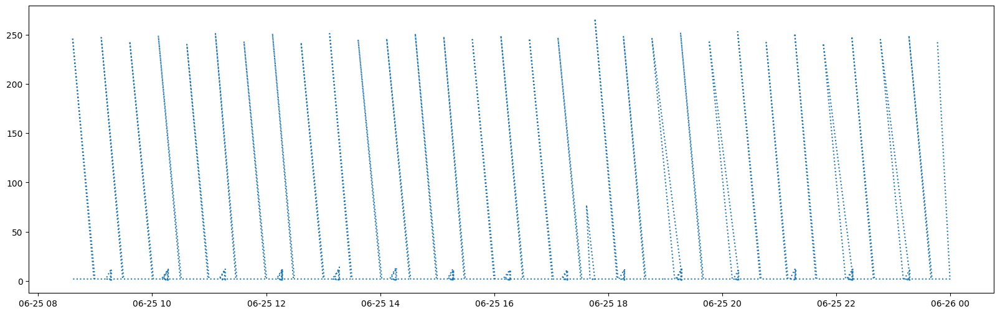

'panasonic_doorphone'

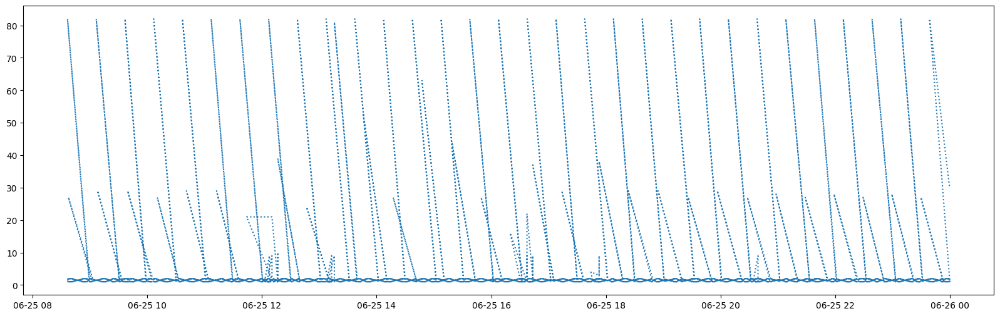

'line_clova_wave'

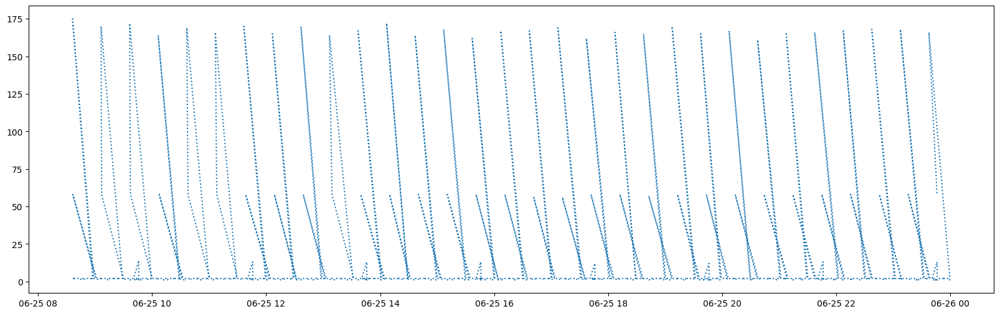

'amazon_echo_gen2'

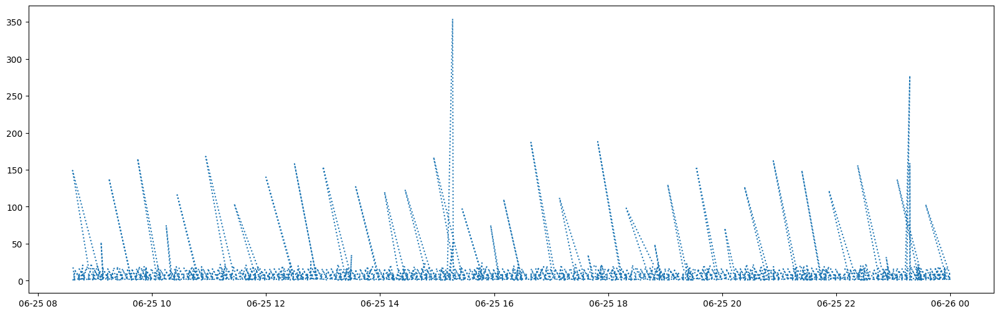

'jvc_kenwood_hdtv_ip_camera'

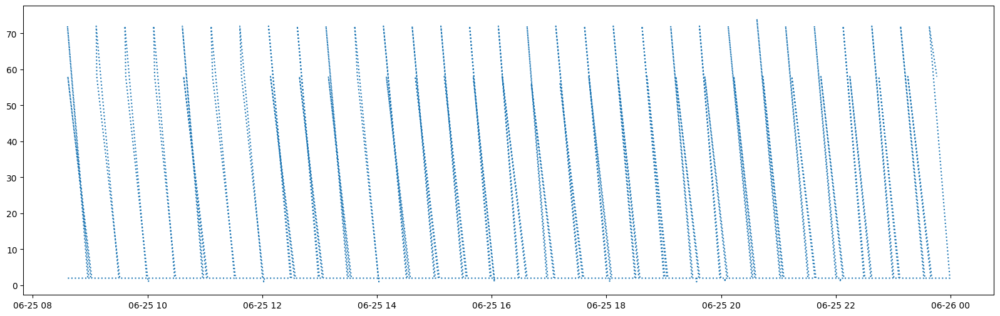

'link_japan_eremote'

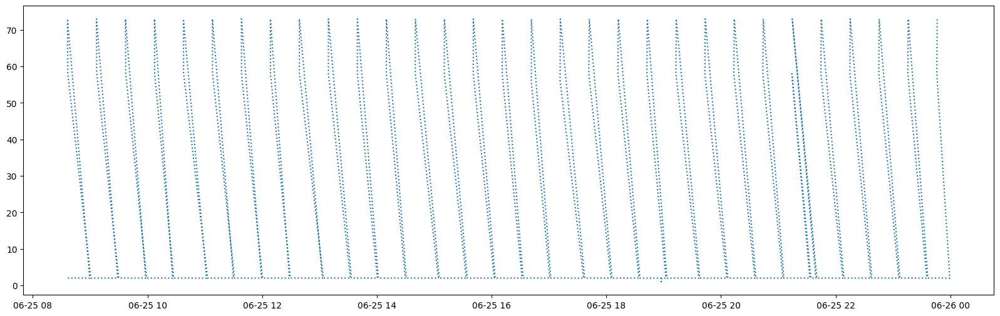

'candy_house_sesami_wi-fi_access_point'

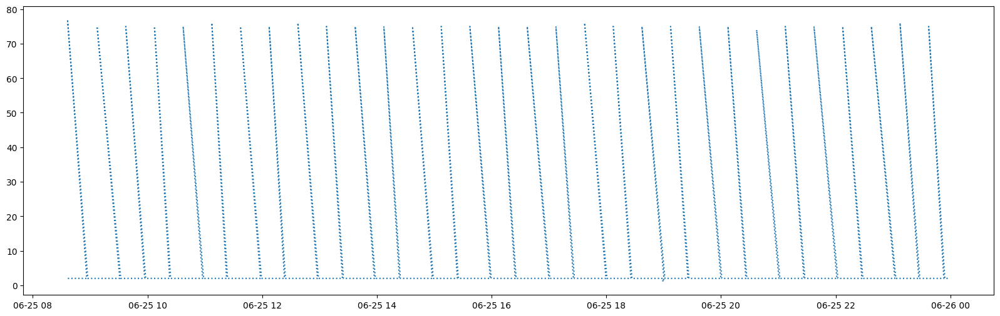

'nature_remo'

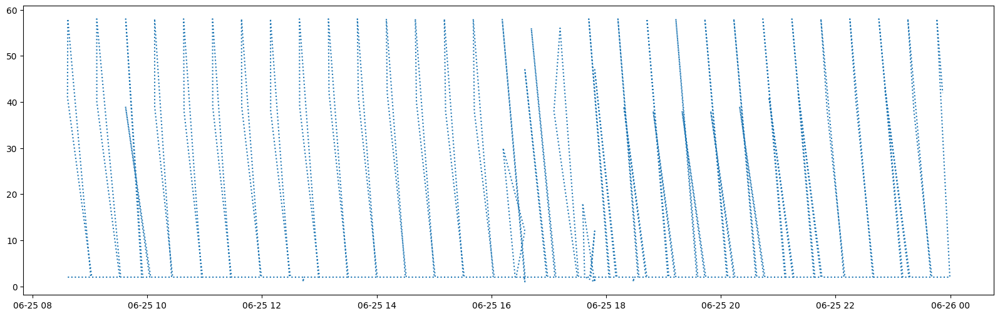

'jvc_kenwood_cu-hb1'

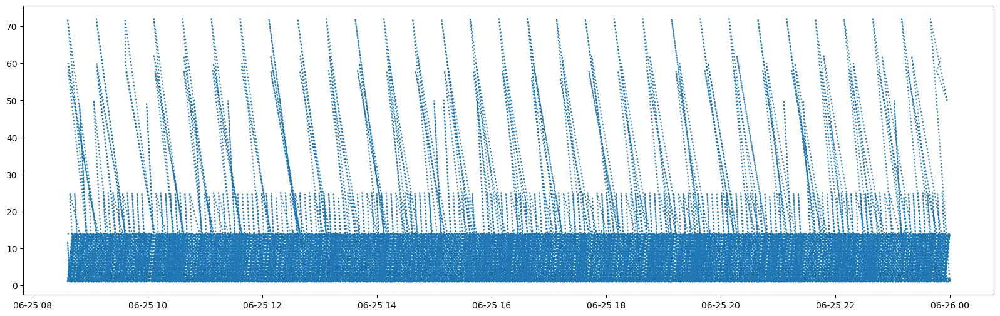

'xiaomi_mijia_led'

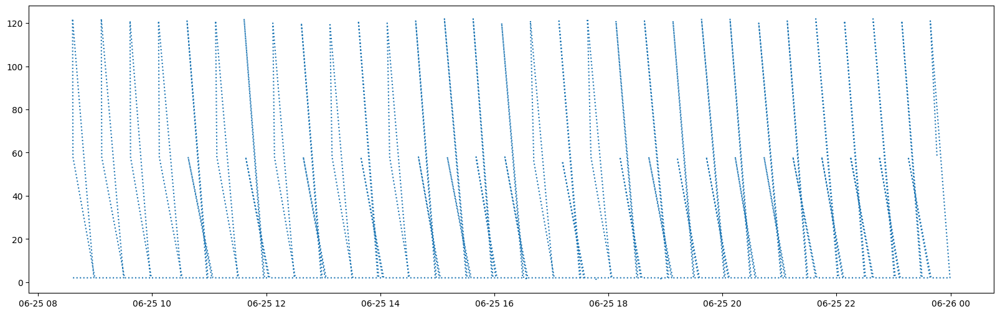

'irobot_roomba'

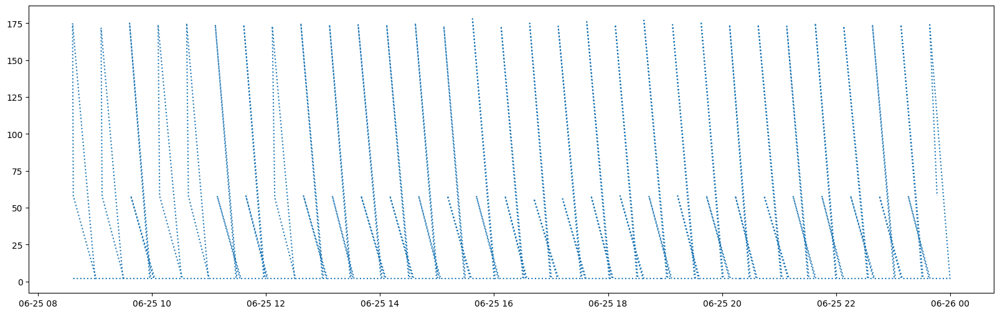

'sony_smart_speaker'

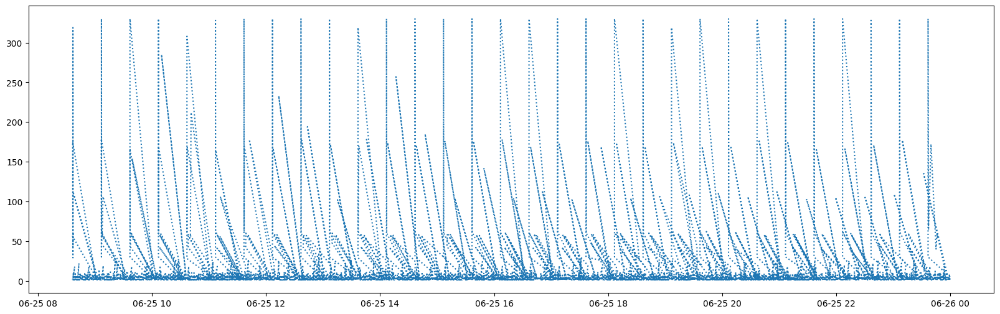

'qrio_hub'

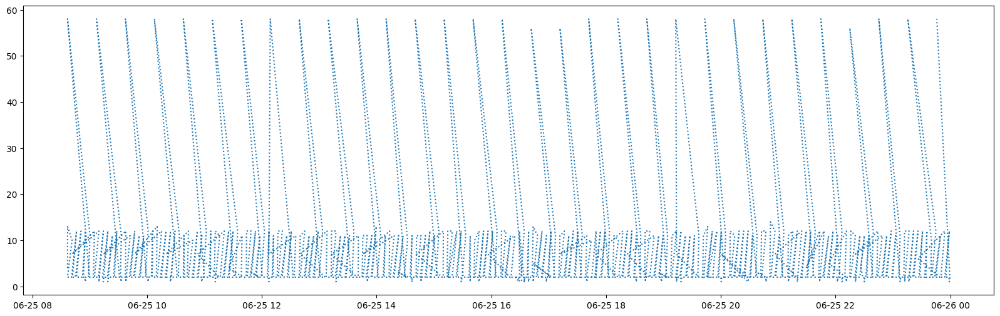

'au_wireless_adapter'

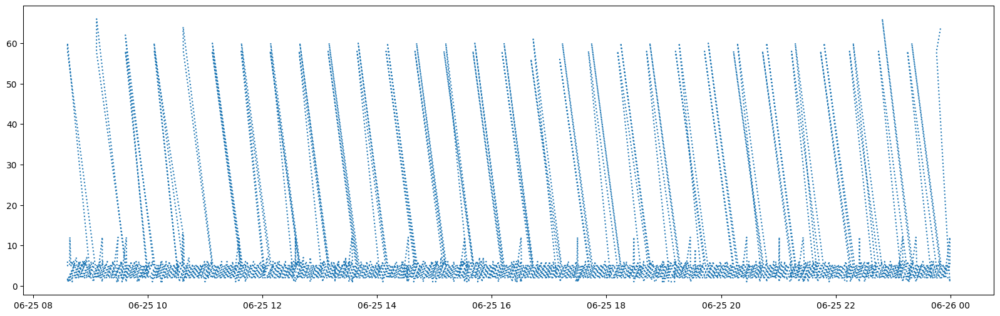

'planex_camera_one_shot!'

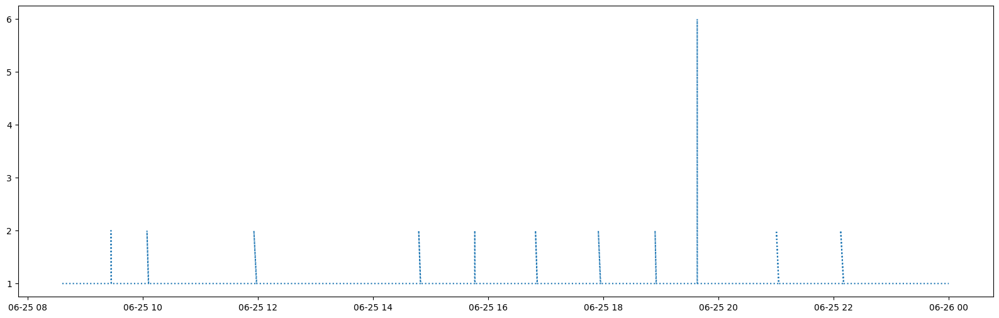

'philips_hue_bridge'

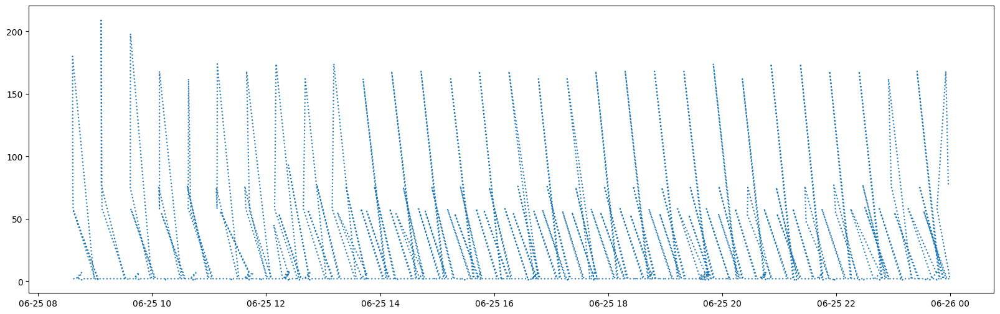

'planex_smacam_pantilt'

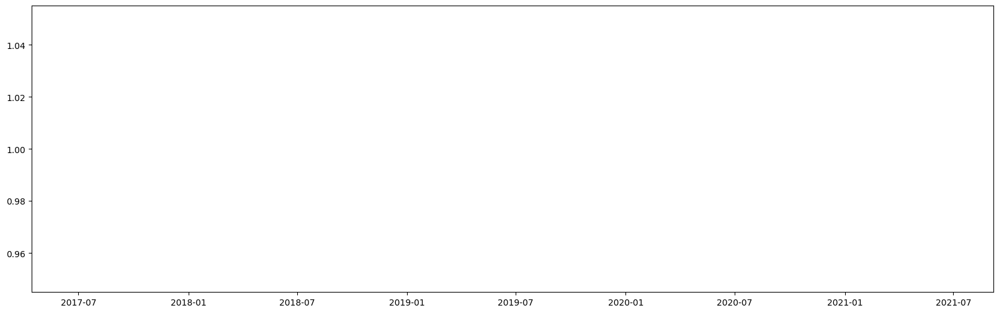

'au_network_camera'

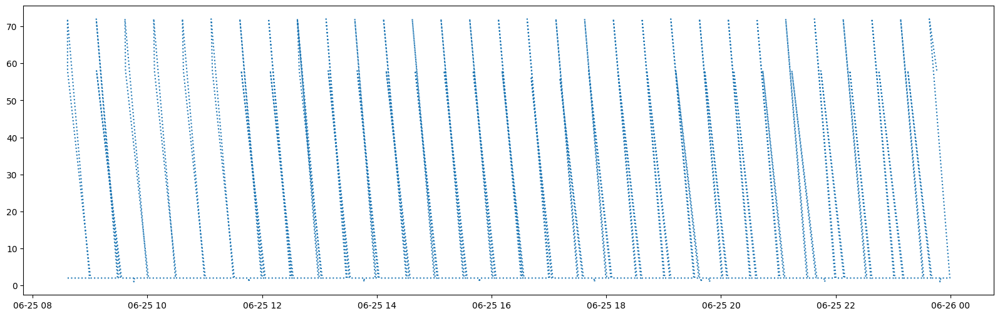

'planex_smacam_outdoor'

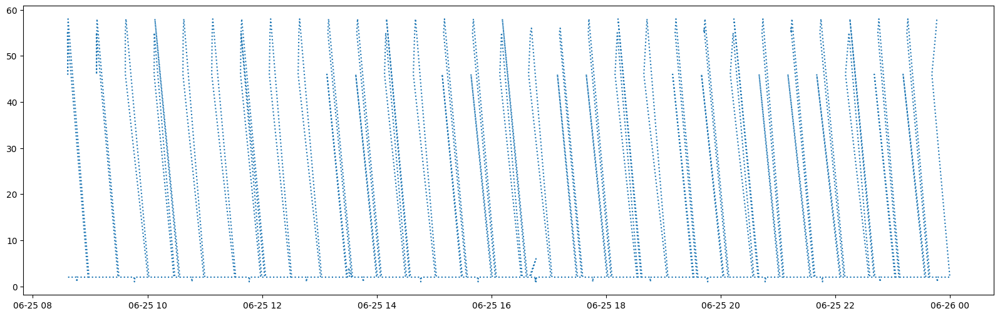

'mouse_computer_room_hub'

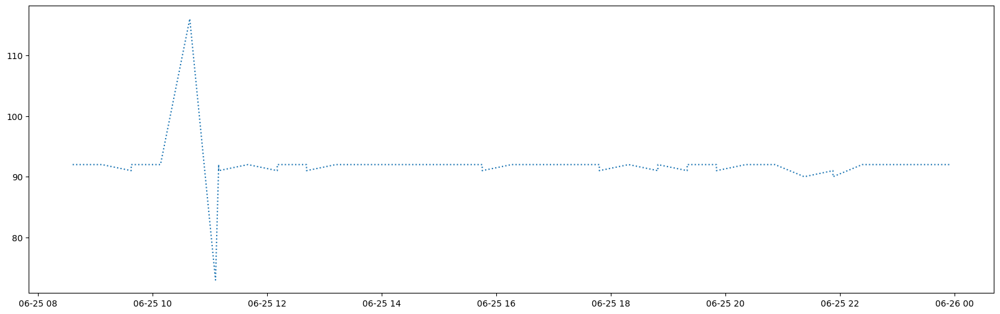

'sony_network_camera'

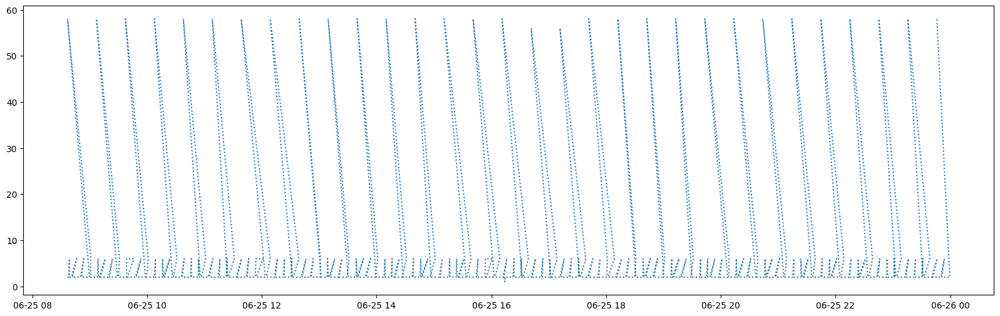

'powerelectric_wi-fi_plug'

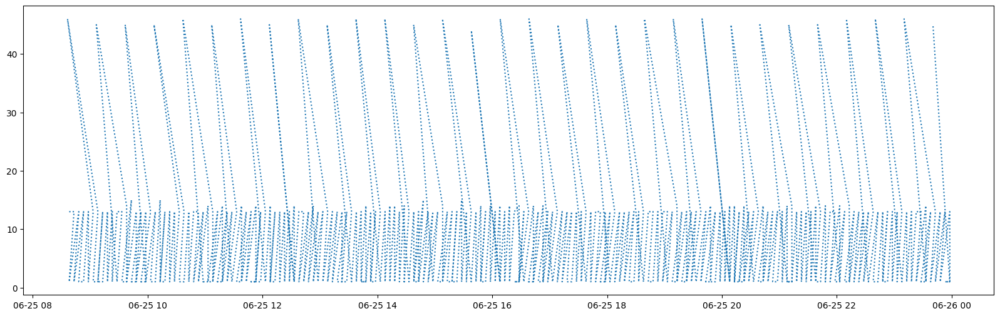

In [17]:
for device in df['Device'].unique():
  res = day_df[day_df['Device'] == device]
  display(device)
  plt.figure(figsize=(20,6))
  plt.plot(res['flowStartMilliseconds'], res['packetTotalCount'], linestyle = 'dotted')
  plt.show()

# ts = pd.date_range('2022-03-04', periods=10, freq='12h20min')
# df_row = pd.DataFrame({'ts': ts, 'qty': [np.random.randint(10, 100) for i in range(10)]})
# df_col = pd.DataFrame(np.random.randint(0,100,size=(5, 10)), columns = ts)

In [18]:
hour_df = df.set_index(df["flowStartMilliseconds"]).between_time('9:00','10:00')
hour_df.head()

,flowStartMilliseconds,flowEndMilliseconds,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,protocolIdentifier,sourceIPv4Address,sourceTransportPort,packetTotalCount,octetTotalCount,flowAttributes,...,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket,Device
flowStartMilliseconds,,,,,,,,,,,,,,,,,,,,,
2019-06-25 09:00:44.627,2019-06-25 09:00:44.627,2019-06-25 09:00:45.199,0.572,0.0,17.0,192.168.1.1,54811.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2019-06-25 09:01:47.189,2019-06-25 09:01:47.189,2019-06-25 09:01:47.764,0.575,0.0,17.0,192.168.1.1,49069.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2019-06-25 09:02:49.622,2019-06-25 09:02:49.622,2019-06-25 09:02:50.177,0.555,0.0,17.0,192.168.1.1,36674.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2019-06-25 09:03:52.528,2019-06-25 09:03:52.528,2019-06-25 09:03:53.107,0.579,0.0,17.0,192.168.1.1,38707.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy
2019-06-25 09:04:54.805,2019-06-25 09:04:54.805,2019-06-25 09:04:55.360,0.555,0.0,17.0,192.168.1.1,43164.0,2.0,156.0,01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,bitfinder_awair_breathe_easy


### Correlation Analysis

Pairplot

In [19]:
# sns.pairplot(df, corner=True)
# plt.tight_layout()
# plt.show()

Heatmap

<ipython-input-20-045eda1d3110>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(df.corr(), fignum=f.number)


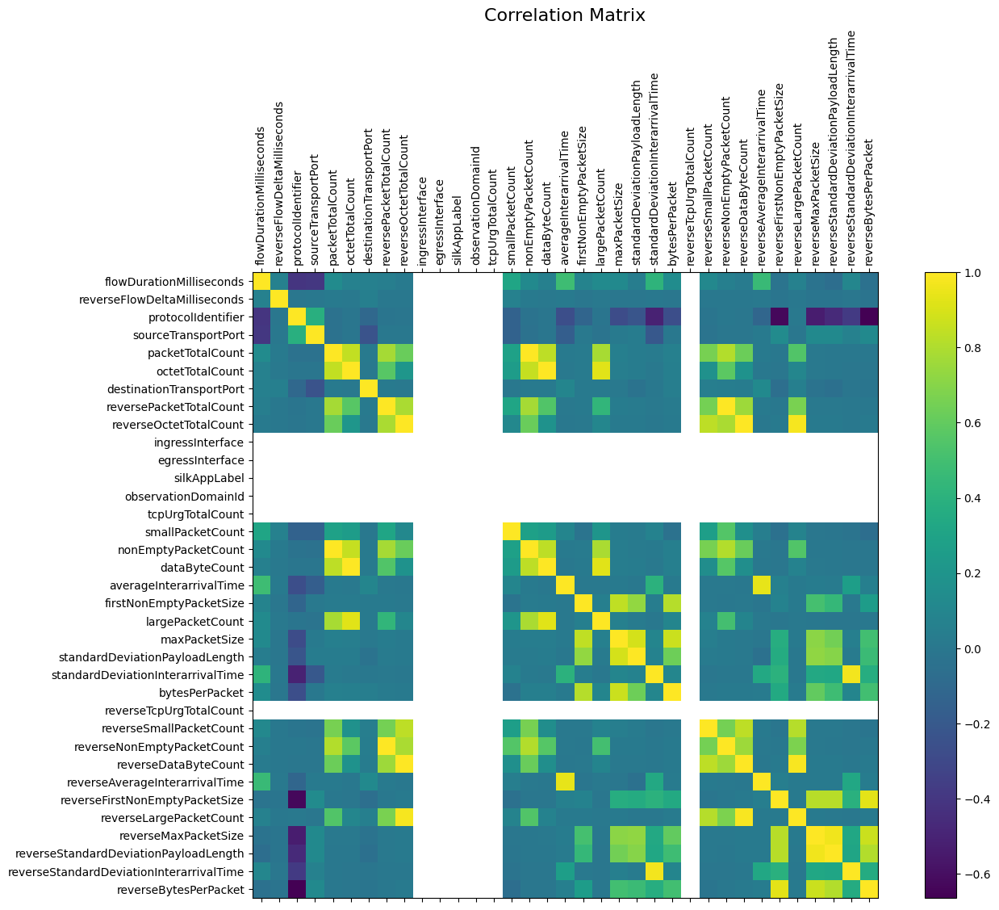

In [20]:
f = plt.figure(figsize=(15, 10))
plt.matshow(df.corr(), fignum=f.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=10, rotation=90)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=10)
plt.title('Correlation Matrix', fontsize=16);

Correlation Matrix

In [21]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None, vmin=-1, vmax=1).format(precision=2)

<ipython-input-21-489aadf35a8c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()


,flowDurationMilliseconds,reverseFlowDeltaMilliseconds,protocolIdentifier,sourceTransportPort,packetTotalCount,octetTotalCount,destinationTransportPort,reversePacketTotalCount,reverseOctetTotalCount,ingressInterface,egressInterface,silkAppLabel,observationDomainId,tcpUrgTotalCount,smallPacketCount,nonEmptyPacketCount,dataByteCount,averageInterarrivalTime,firstNonEmptyPacketSize,largePacketCount,maxPacketSize,standardDeviationPayloadLength,standardDeviationInterarrivalTime,bytesPerPacket,reverseTcpUrgTotalCount,reverseSmallPacketCount,reverseNonEmptyPacketCount,reverseDataByteCount,reverseAverageInterarrivalTime,reverseFirstNonEmptyPacketSize,reverseLargePacketCount,reverseMaxPacketSize,reverseStandardDeviationPayloadLength,reverseStandardDeviationInterarrivalTime,reverseBytesPerPacket
flowDurationMilliseconds,1.00,0.06,-0.41,-0.40,0.14,0.07,0.06,0.05,0.02,nan,nan,nan,nan,nan,0.31,0.13,0.06,0.49,0.08,0.13,0.13,0.04,0.42,0.14,nan,0.11,0.05,0.03,0.46,-0.03,0.07,-0.03,-0.06,0.10,-0.04
reverseFlowDeltaMilliseconds,0.06,1.00,-0.00,-0.00,0.01,0.01,0.05,0.00,0.00,nan,nan,nan,nan,nan,0.07,0.01,0.01,0.02,-0.00,0.01,-0.00,-0.00,0.00,-0.01,nan,0.00,0.00,-0.00,0.01,-0.02,-0.00,-0.02,-0.01,-0.01,-0.02
protocolIdentifier,-0.41,-0.00,1.00,0.39,-0.04,-0.01,-0.10,-0.02,-0.01,nan,nan,nan,nan,nan,-0.14,-0.03,-0.01,-0.26,-0.12,-0.02,-0.28,-0.23,-0.50,-0.26,nan,-0.02,0.00,-0.00,-0.12,-0.63,0.01,-0.53,-0.46,-0.38,-0.66
sourceTransportPort,-0.40,-0.00,0.39,1.00,-0.04,-0.01,-0.24,-0.00,-0.00,nan,nan,nan,nan,nan,-0.14,-0.04,-0.01,-0.17,0.01,-0.02,0.02,0.04,-0.21,0.00,nan,-0.03,-0.00,-0.00,0.01,0.14,-0.00,0.12,0.13,0.07,0.12
packetTotalCount,0.14,0.01,-0.04,-0.04,1.00,0.85,0.02,0.78,0.62,nan,nan,nan,nan,nan,0.29,1.00,0.83,0.02,0.03,0.79,0.05,0.03,0.03,0.06,nan,0.66,0.81,0.62,0.01,0.00,0.55,0.01,0.00,0.00,-0.00
octetTotalCount,0.07,0.01,-0.01,-0.01,0.85,1.00,0.01,0.57,0.21,nan,nan,nan,nan,nan,0.25,0.85,1.00,0.01,0.03,0.93,0.04,0.04,0.01,0.05,nan,0.18,0.58,0.18,0.00,-0.00,0.10,0.01,0.00,-0.00,-0.00
destinationTransportPort,0.06,0.05,-0.10,-0.24,0.02,0.01,1.00,0.01,0.01,nan,nan,nan,nan,nan,0.00,0.02,0.01,0.10,0.02,0.02,0.01,-0.03,0.00,0.05,nan,0.05,0.04,0.04,0.12,-0.06,0.05,-0.03,-0.05,-0.01,-0.02
reversePacketTotalCount,0.05,0.00,-0.02,-0.00,0.78,0.57,0.01,1.00,0.79,nan,nan,nan,nan,nan,0.31,0.78,0.55,0.01,0.01,0.43,0.03,0.03,0.01,0.03,nan,0.65,1.00,0.76,0.01,0.00,0.67,0.01,0.01,0.00,0.00
reverseOctetTotalCount,0.02,0.00,-0.01,-0.00,0.62,0.21,0.01,0.79,1.00,nan,nan,nan,nan,nan,0.11,0.62,0.19,0.01,0.01,0.10,0.02,0.01,0.01,0.02,nan,0.84,0.79,1.00,0.01,0.01,0.98,0.02,0.02,0.00,0.02
ingressInterface,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


Scatter Plot for Variable Pairs > 0.8 Correlation

In [22]:
corr_abs = df.corr().abs()

corr_list = corr_abs.unstack()
corr_head = corr_list.sort_values(kind="quicksort")


<ipython-input-22-f14eff92370c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_abs = df.corr().abs()


In [23]:
top = corr_head.loc[lambda x : (x > 0.8) & (x < 1)]
top = pd.DataFrame(top)
top = top.reset_index()
top_features = top["level_1"].unique().tolist()

In [24]:
top_clean = top.iloc[::2,:]
features1 = top_clean["level_0"].tolist()
features2 = top_clean["level_1"].tolist()

In [25]:
# corr = df.corr()
# temp_list = corr.unstack()
# temp_list = temp_list.sort_values(kind="quicksort")
# temp = temp_list.loc[lambda x : (abs(x) > 0.8) & (abs(x) <= 1)]
# temp.iloc[::2]

In [26]:
df_top = df[top_features]

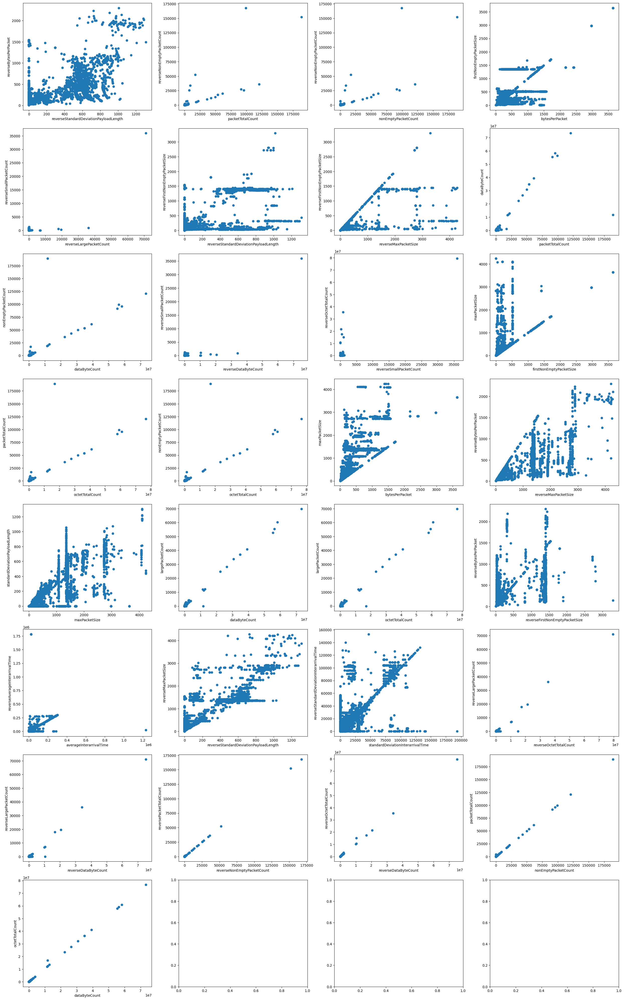

In [27]:
count=1
fig, axs = plt.subplots(8, 4, figsize=(25,40))

i = 0
for ax in axs.ravel():
  if (i >= len(features1)):
    break
  x = df_top[features1[i]]
  y = df_top[features2[i]]
  ax.scatter(x, y)
  ax.set_xlabel(features1[i])
  ax.set_ylabel(features2[i])
  i+=1

fig.tight_layout()
plt.show()

### Missing Values Check


In [28]:
# Analyse missing values - for each feature
nan_count_feature = df.isna().sum()
nan_count_feature = pd.DataFrame(nan_count_feature.loc[lambda x: x > 0])
nan_count_feature = nan_count_feature.set_axis(['Count'], axis=1)

# Get percentage of missing values
nan_count_feature['Percentage'] = (nan_count_feature.Count / 2116934) * 100
nan_count_feature = nan_count_feature.apply(lambda x: round(x, 2))
nan_count_feature[nan_count_feature['Percentage'] > 0]

,Count,Percentage
tcpUrgTotalCount,58248,2.75
smallPacketCount,58248,2.75
nonEmptyPacketCount,58248,2.75
dataByteCount,58248,2.75
averageInterarrivalTime,58248,2.75
firstNonEmptyPacketSize,58248,2.75
largePacketCount,58248,2.75
maxPacketSize,58248,2.75
firstEightNonEmptyPacketDirections,58248,2.75
standardDeviationPayloadLength,58248,2.75


In [29]:
count_device = df.drop('Device', 1).groupby(df.Device, sort=False).count().reset_index()
count_device['Total'] = count_device.sum(axis=1)
count_device = count_device.loc[:, (count_device != 0).any(axis=0)]
count_device = count_device[['Total']]

<ipython-input-29-f98cb2b8b07b>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  count_device = df.drop('Device', 1).groupby(df.Device, sort=False).count().reset_index()
<ipython-input-29-f98cb2b8b07b>:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  count_device['Total'] = count_device.sum(axis=1)


In [30]:
# Missing values - for each device
nan_count_device = df.drop('Device', 1).isna().groupby(df.Device, sort=False).sum().reset_index()
nan_count_device['Count'] = nan_count_device.sum(axis=1)
nan_count_device = nan_count_device.loc[:, (nan_count_device != 0).any(axis=0)]
nan_count_device = nan_count_device[['Device','Count']]

# Get percentage of missing values
nan_device = pd.merge(nan_count_device, count_device, left_index=True, right_index=True)
nan_device['Percentage'] = (nan_device.Count / nan_device.Total) * 100
nan_device['Percentage'] = nan_device['Percentage'].apply(lambda x: round(x, 2))
nan_device[['Device','Count','Percentage']]

<ipython-input-30-8dce9d18467b>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  nan_count_device = df.drop('Device', 1).isna().groupby(df.Device, sort=False).sum().reset_index()
<ipython-input-30-8dce9d18467b>:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  nan_count_device['Count'] = nan_count_device.sum(axis=1)


,Device,Count,Percentage
0,bitfinder_awair_breathe_easy,1000983,22.75
1,panasonic_doorphone,696104,14.80
2,line_clova_wave,926731,20.72
3,amazon_echo_gen2,633766,13.30
4,jvc_kenwood_hdtv_ip_camera,1012044,23.06
5,link_japan_eremote,1115469,26.03
6,candy_house_sesami_wi-fi_access_point,1146539,26.96
7,nature_remo,1073972,24.83
8,jvc_kenwood_cu-hb1,438561,8.84
9,xiaomi_mijia_led,1058163,24.37


### Post Variable Selection: Feature Analysis

Key Variables: Table Form

In [31]:
key_features = ['sourceTransportPort', 'flowDurationMilliseconds', 'destinationIPv4Address', 'sourceIPv4Address',
                   'averageInterarrivalTime', 'octetTotalCount', 'firstNonEmptyPacketSize',
                    'dataByteCount', 'bytesPerPacket']

categorical_features = ['sourceTransportPort', 'destinationIPv4Address', 'sourceIPv4Address']
## Relative Frequencies of sourceTransportPort by device
for feature in categorical_features:
  ports = df.groupby('Device')[feature].value_counts(normalize=True).mul(100).reset_index(name='Percentage')
  print("\n", feature, "percentages:\n")

  ## Show the results with significant percentages
  port_percent = ports[ports['Percentage'] > 10].sort_values(['Device', 'Percentage'], ascending=[True, False])
  display(port_percent)



 sourceTransportPort percentages:



,Device,sourceTransportPort,Percentage
40044,au_network_camera,59403.0,32.273000
186310,jvc_kenwood_cu-hb1,443.0,14.660000
240071,line_clova_wave,123.0,11.314000
292446,mouse_computer_room_hub,9956.0,87.804158
520945,sony_network_camera,52323.0,13.755000



 destinationIPv4Address percentages:



,Device,destinationIPv4Address,Percentage
0,amazon_echo_gen2,192.168.1.42,34.644000
1,amazon_echo_gen2,192.168.1.1,34.220000
2880,au_network_camera,192.168.1.140,59.936000
2881,au_network_camera,210.196.79.193,26.917000
2936,au_wireless_adapter,133.243.239.101,27.320000
2937,au_wireless_adapter,133.243.3.15,26.600000
2938,au_wireless_adapter,192.168.1.130,25.598000
2939,au_wireless_adapter,192.168.1.1,18.828000
2947,bitfinder_awair_breathe_easy,192.168.1.2,58.265000
2948,bitfinder_awair_breathe_easy,192.168.1.1,17.172000



 sourceIPv4Address percentages:



,Device,sourceIPv4Address,Percentage
0,amazon_echo_gen2,192.168.1.42,64.938000
1,amazon_echo_gen2,192.168.1.1,32.067000
86,au_network_camera,192.168.1.1,59.607000
87,au_network_camera,192.168.1.140,40.063000
100,au_wireless_adapter,192.168.1.130,74.402000
101,au_wireless_adapter,192.168.1.1,23.890000
112,bitfinder_awair_breathe_easy,192.168.1.1,54.229000
113,bitfinder_awair_breathe_easy,192.168.1.2,41.735000
120,candy_house_sesami_wi-fi_access_point,192.168.1.1,85.660000
121,candy_house_sesami_wi-fi_access_point,192.168.1.45,13.060000


In [32]:
# Group by 'sourceTransportPort' and calculate the percentage of each 'Device' for each port
port_device_percentage = df.groupby('sourceTransportPort')['Device'].value_counts(normalize=True).mul(100).rename('Percentage').reset_index()

# Sort the results for better readability and analysis
port_device_percentage_sorted = port_device_percentage.sort_values(['sourceTransportPort', 'Percentage'], ascending=[True, False])

# Now, display the sorted dataframe
#print(port_device_percentage_sorted)
port_device_percentage_sorted.head(30)

,sourceTransportPort,Device,Percentage
0,0.0,amazon_echo_gen2,58.616670
1,0.0,planex_smacam_outdoor,20.526520
2,0.0,jvc_kenwood_cu-hb1,11.948708
3,0.0,sony_smart_speaker,8.723528
4,0.0,philips_hue_bridge,0.097144
5,0.0,powerelectric_wi-fi_plug,0.087430
6,3.0,jvc_kenwood_hdtv_ip_camera,9.243914
7,3.0,nature_remo,9.034999
8,3.0,irobot_roomba,8.938757
9,3.0,xiaomi_mijia_led,8.912936


In [33]:
port_device_percentage_sorted.tail(30)

,sourceTransportPort,Device,Percentage
602033,65512.0,panasonic_doorphone,100.000000
602034,65513.0,candy_house_sesami_wi-fi_access_point,100.000000
602035,65514.0,au_wireless_adapter,100.000000
602036,65515.0,amazon_echo_gen2,100.000000
602037,65518.0,au_wireless_adapter,100.000000
602038,65520.0,au_wireless_adapter,100.000000
602039,65521.0,amazon_echo_gen2,50.000000
602040,65521.0,au_wireless_adapter,50.000000
602041,65522.0,amazon_echo_gen2,66.666667
602042,65522.0,au_wireless_adapter,33.333333


Key Variables: Bar Plots


 sourceTransportPort percentages:



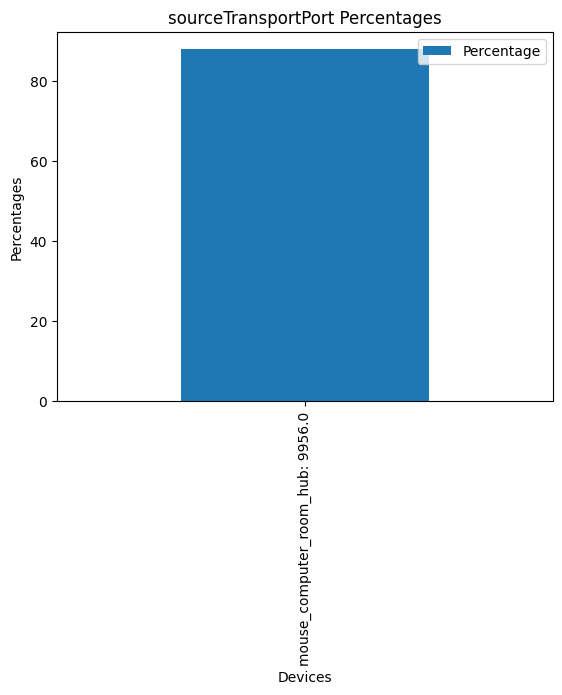


 flowDurationMilliseconds percentages:



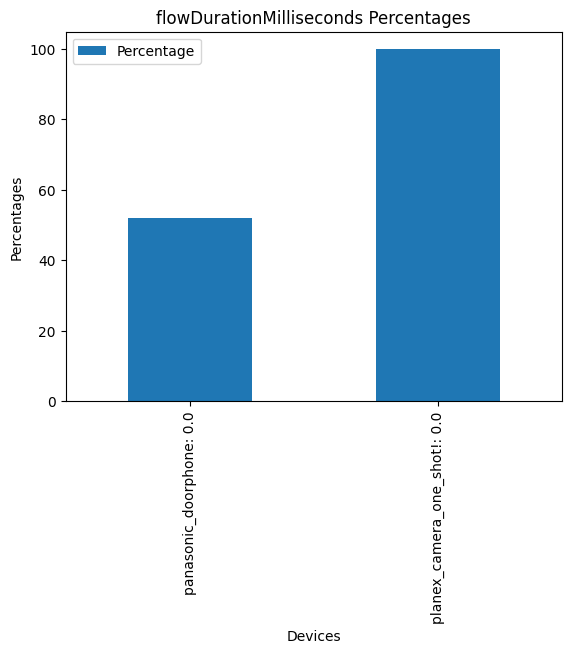


 destinationIPv4Address percentages:



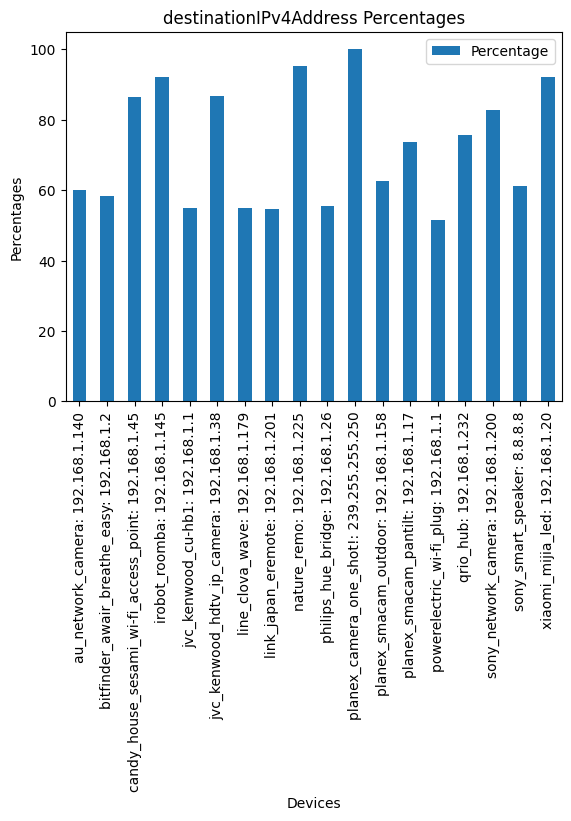


 sourceIPv4Address percentages:



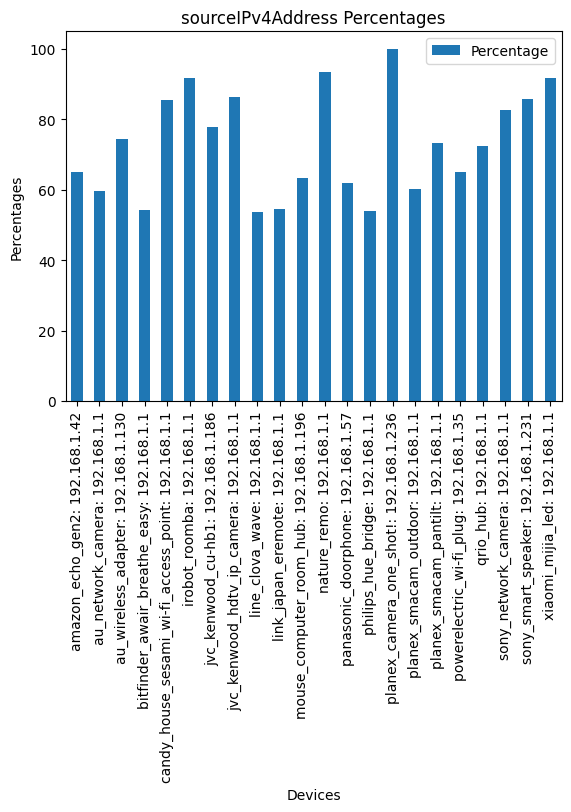


 averageInterarrivalTime percentages:



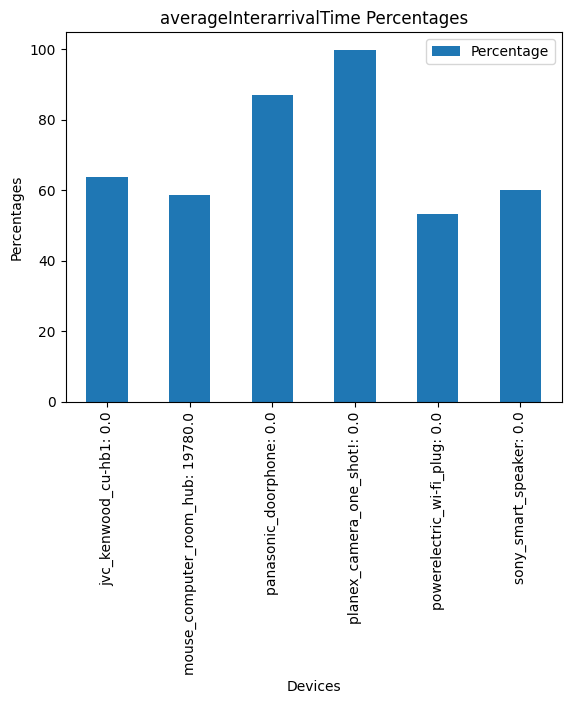


 octetTotalCount percentages:



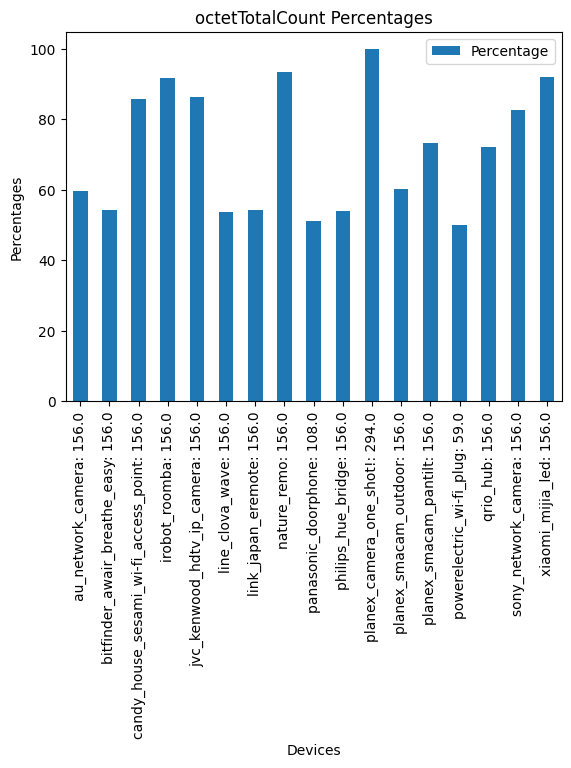


 firstNonEmptyPacketSize percentages:



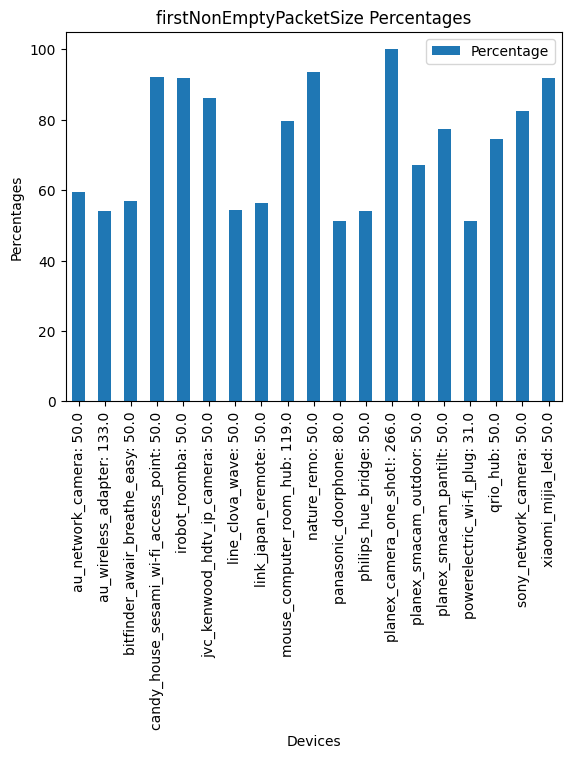


 dataByteCount percentages:



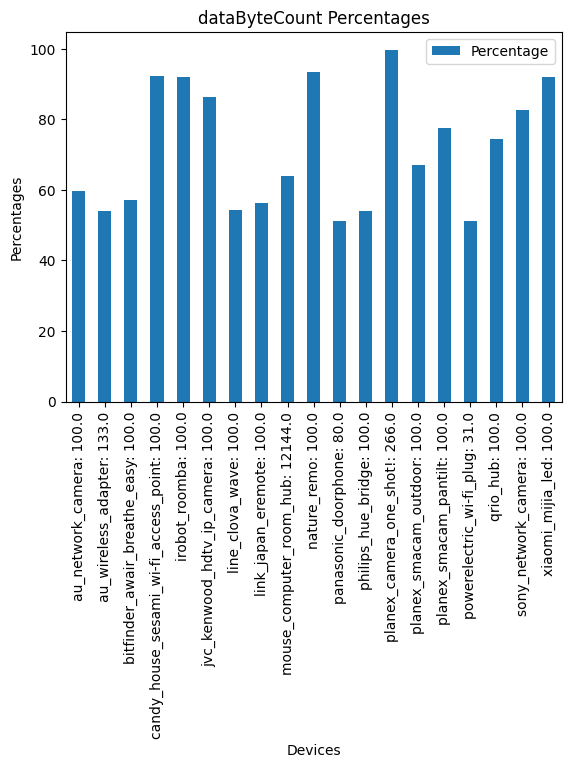


 bytesPerPacket percentages:



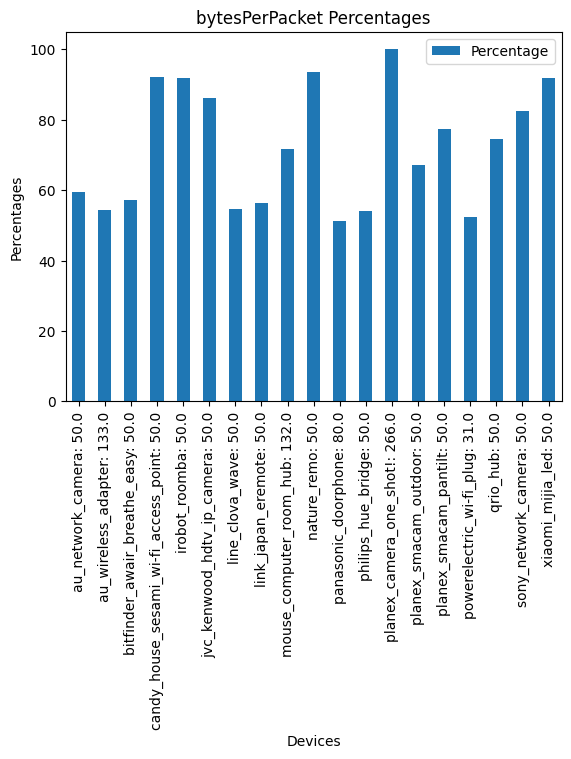

In [34]:
for feature in key_features:
  ports = df.groupby('Device')[feature].value_counts(normalize=True).mul(100).reset_index(name='Percentage')
  print("\n", feature, "percentages:\n")

  ## Show the results with significant percentages
  port_percent = ports[ports['Percentage'] > 10].sort_values(['Device', 'Percentage'], ascending=[True, False])
  port_percent['Device:Feature'] = port_percent['Device'] + ': ' + port_percent[feature].astype(str)
  port_percent[port_percent['Percentage'] > 50].plot(kind='bar', stacked=True, x='Device:Feature', y='Percentage')  # You can use 'bar' or 'barh' for horizontal bars

  # Customize the plot (optional)
  plt.title(f'{feature} Percentages')
  plt.xlabel('Devices')
  plt.ylabel('Percentages')

  # Show the plot
  plt.show()

Key Time Variables

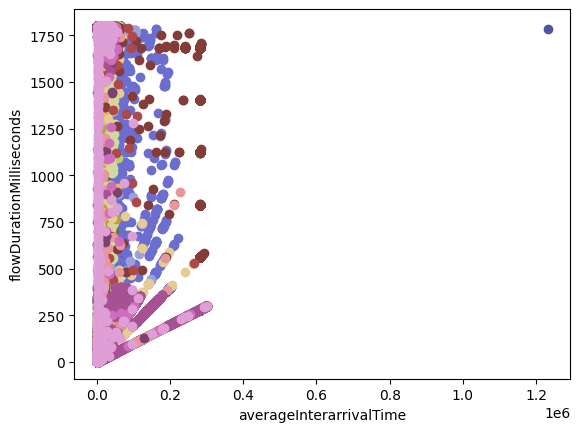

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


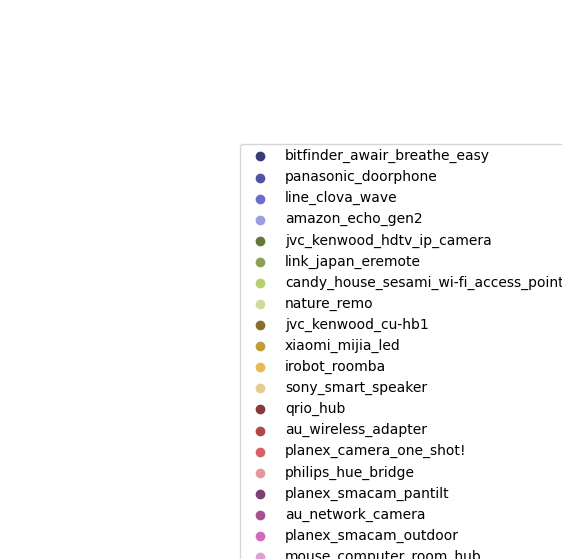

Seemingly no relationship between the two time variables
Collection of low averageInterarrivalTimes indicates that most of the packets are sent in bursts, with spikes in activity


In [35]:
time_vars = df[['flowDurationMilliseconds', 'averageInterarrivalTime', 'Device']]

devices = df['Device'].unique()
color_map = {unique_class: plt.cm.tab20b(i) for i, unique_class in enumerate(devices)}

for device in devices:
    class_df = time_vars[time_vars['Device'] == device]
    plt.scatter( class_df['averageInterarrivalTime'], class_df['flowDurationMilliseconds'], label=device, color=color_map[device])

# Add labels and a legend
plt.xlabel('averageInterarrivalTime')
plt.ylabel('flowDurationMilliseconds')
legend = plt.legend()

# Remove the original legend from the plot
ax = plt.gca()
ax.get_legend().remove()


# Show the plot
plt.show()
print("\n", "\n", "\n")
# Display the legend separately
plt.figure(figsize=(7,7))  # Create a new figure for the legend
plt.gca().add_artist(legend)  # Add the legend to the new figure
plt.axis('off')  # Turn off the axis for the legend
plt.show()

print("Seemingly no relationship between the two time variables")
print("Collection of low averageInterarrivalTimes indicates that most of the packets are sent in bursts, with spikes in activity")

/usr/local/lib/python3.10/dist-packages/pandas/plotting/_matplotlib/core.py:512: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


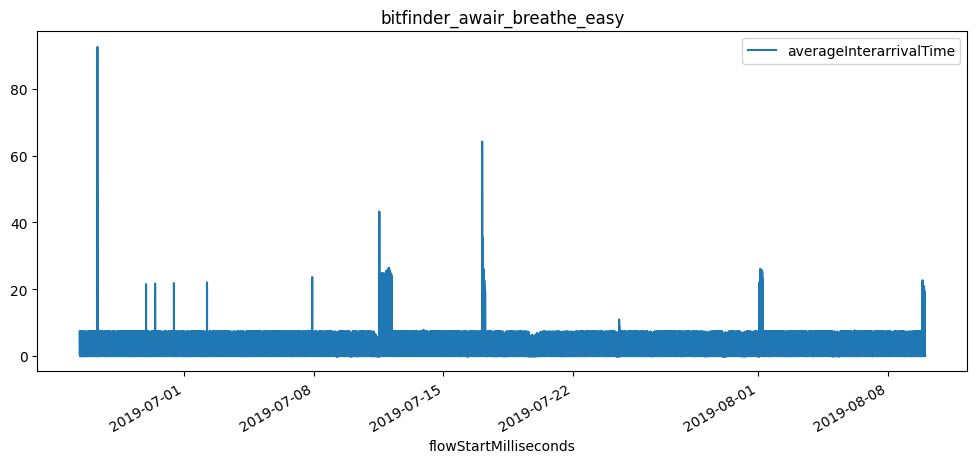

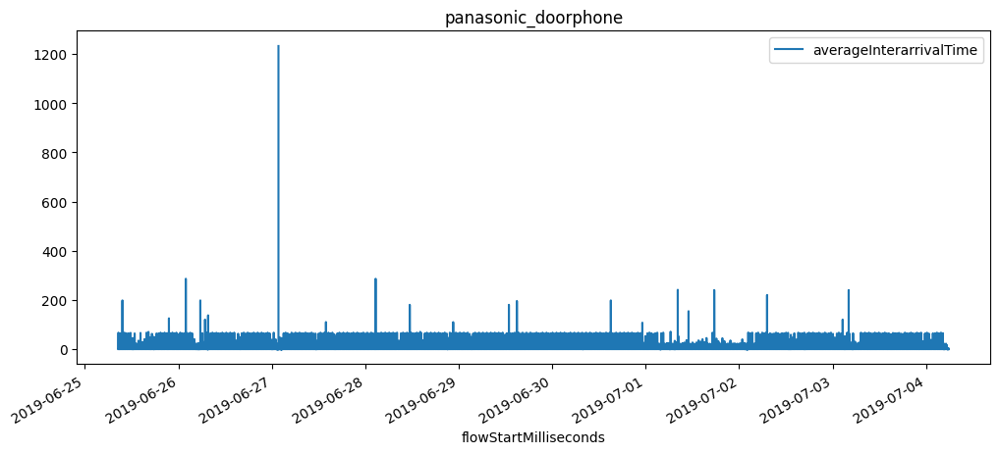

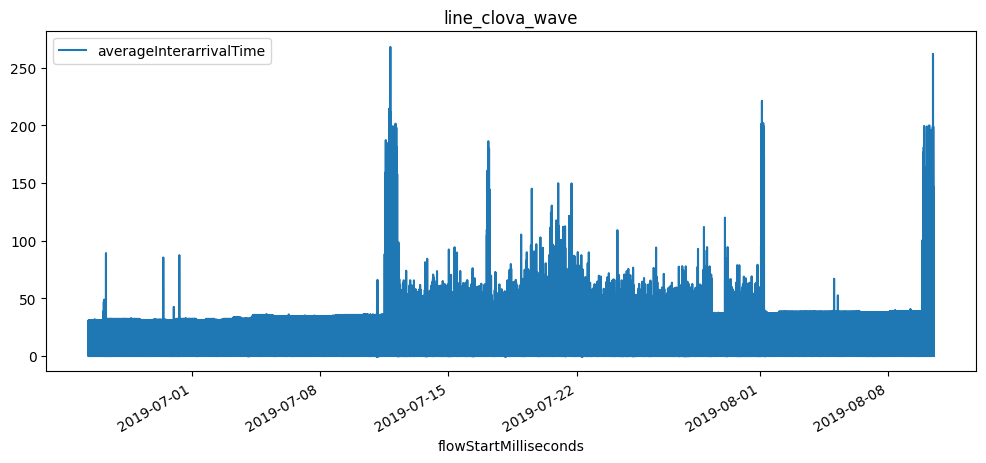

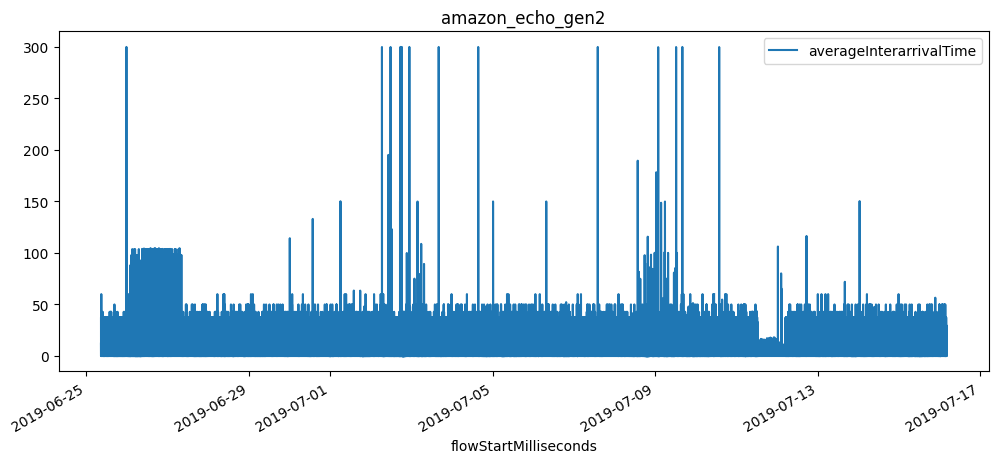

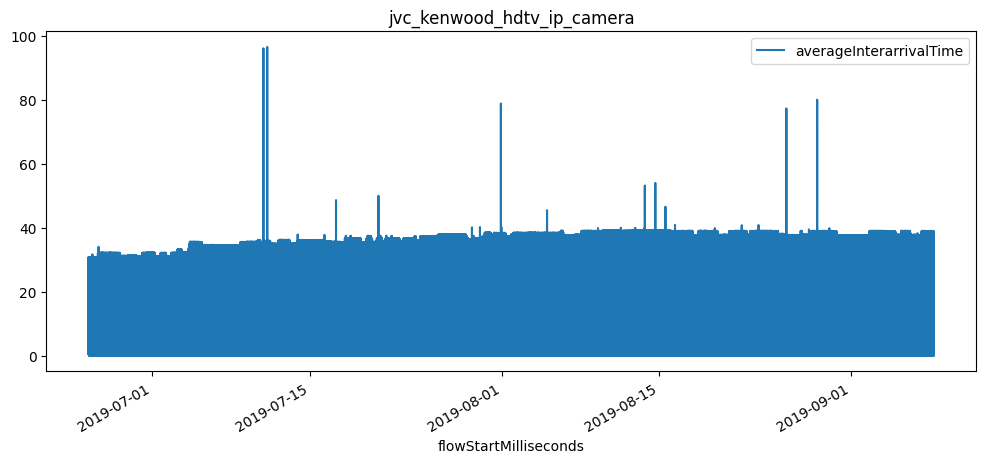

...

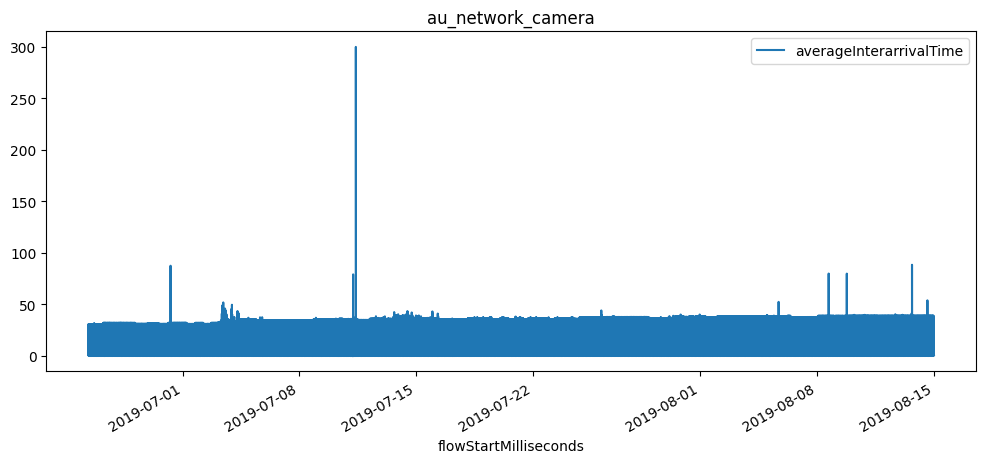

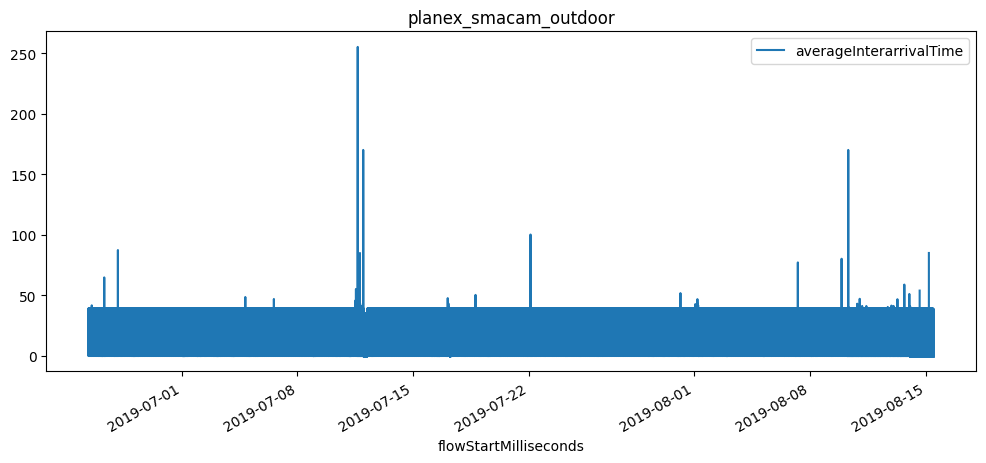

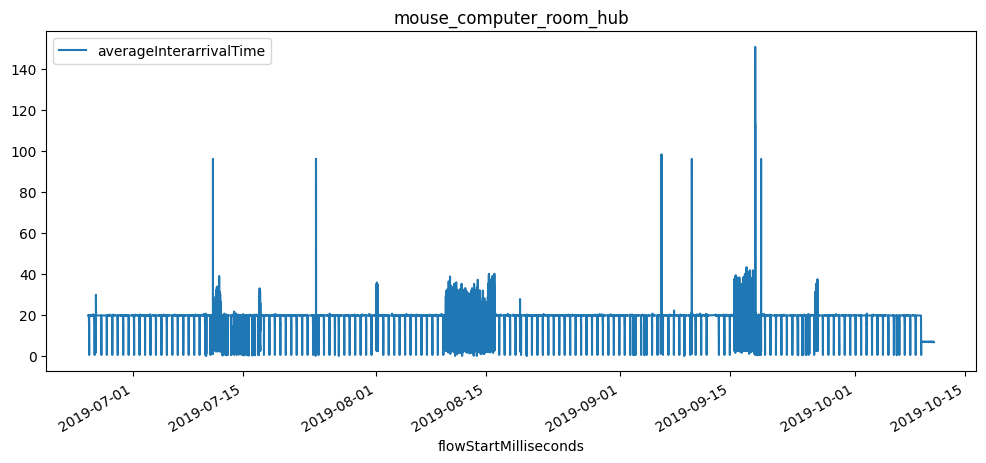

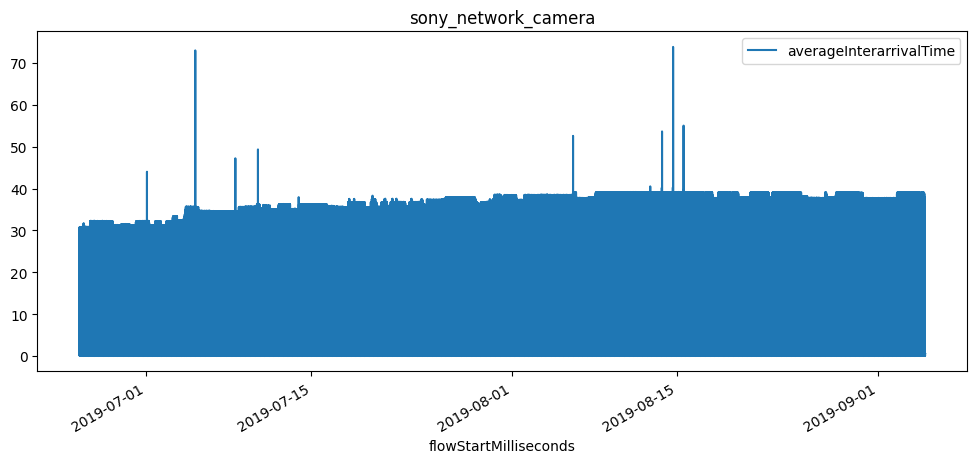

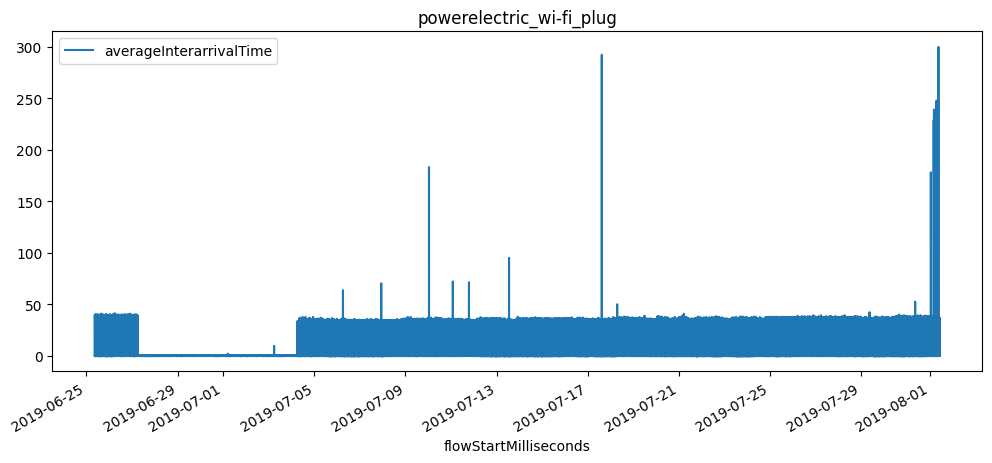

In [36]:
## TO DO: Investigate averageInterArrivalTime behaviour to find spikes in activity
# time_slot = df.set_index(df["flowStartMilliseconds"]).between_time('9:00','10:00')
# fig, axes = plt.subplots(nrows=5,ncols=5, figsize=(17,20))
i = 0
for device in devices:
  # print("\n", device, "\n")
  time_df = df[df["Device"] == device][["flowStartMilliseconds", "averageInterarrivalTime"]]
  time_df['averageInterarrivalTime'] = time_df['averageInterarrivalTime']/1000
  # time_df
  time_df.plot(x="flowStartMilliseconds", y="averageInterarrivalTime", figsize=(12,5))#, ax=axes[i//5, i%5])
  plt.title(device)
  i += 1
plt.show()

### Post Variable Selection: Time Series Analysis

In [37]:
month_df = df[(df['flowStartMilliseconds'] > '2019-07-01') & (df['flowStartMilliseconds'] < '2019-08-01')]

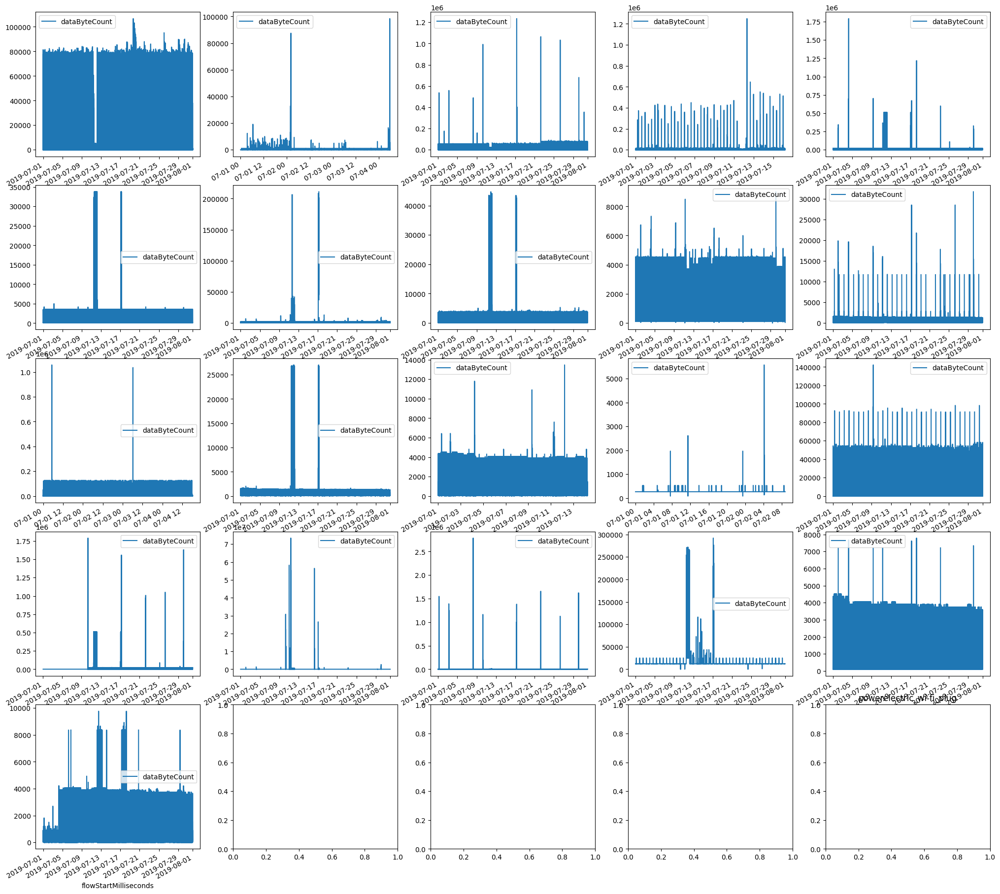

In [38]:
  ## TO DO: Investigate databyteCount behaviour to find spikes in activity
fig, axes = plt.subplots(nrows=5,ncols=5, figsize=(25,25))
i = 0
devices = month_df['Device'].unique()
for device in devices:
    # print("\n", device, "\n")
    time_df = month_df[month_df["Device"] == device][["flowStartMilliseconds", 'dataByteCount']]
    # time_df
    time_df.plot(x="flowStartMilliseconds", y='dataByteCount', ax=axes[i//5, i%5])
    plt.title(device)
    i += 1
plt.show()

  ## Clearly distinct patterns for each device, particularly with w

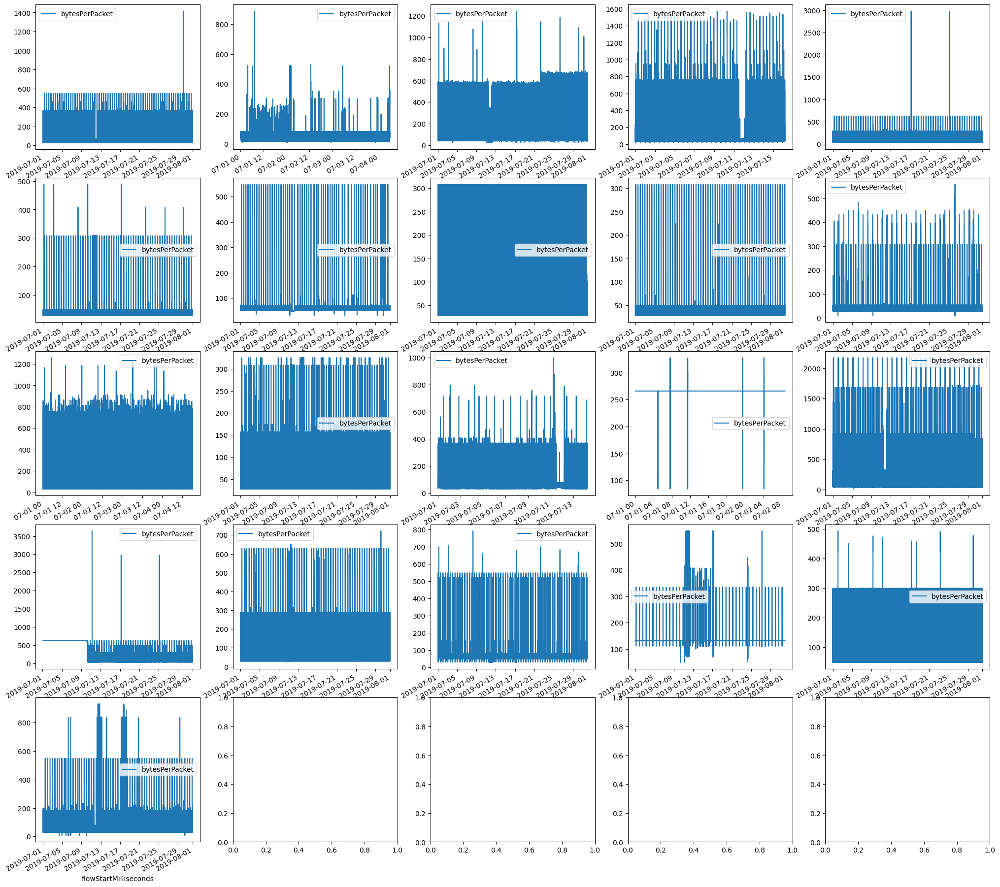

In [39]:
  ## TO DO: Investigate 'bytesPerPacket' behaviour to find spikes in activity
fig, axes = plt.subplots(nrows=5,ncols=5, figsize=(25,25))
i = 0
for device in devices:
    # print("\n", device, "\n")
    time_df = month_df[month_df["Device"] == device][["flowStartMilliseconds", 'bytesPerPacket']]
    # time_df
    time_df.plot(x="flowStartMilliseconds", y='bytesPerPacket', ax=axes[i//5, i%5])
    i += 1
plt.show()

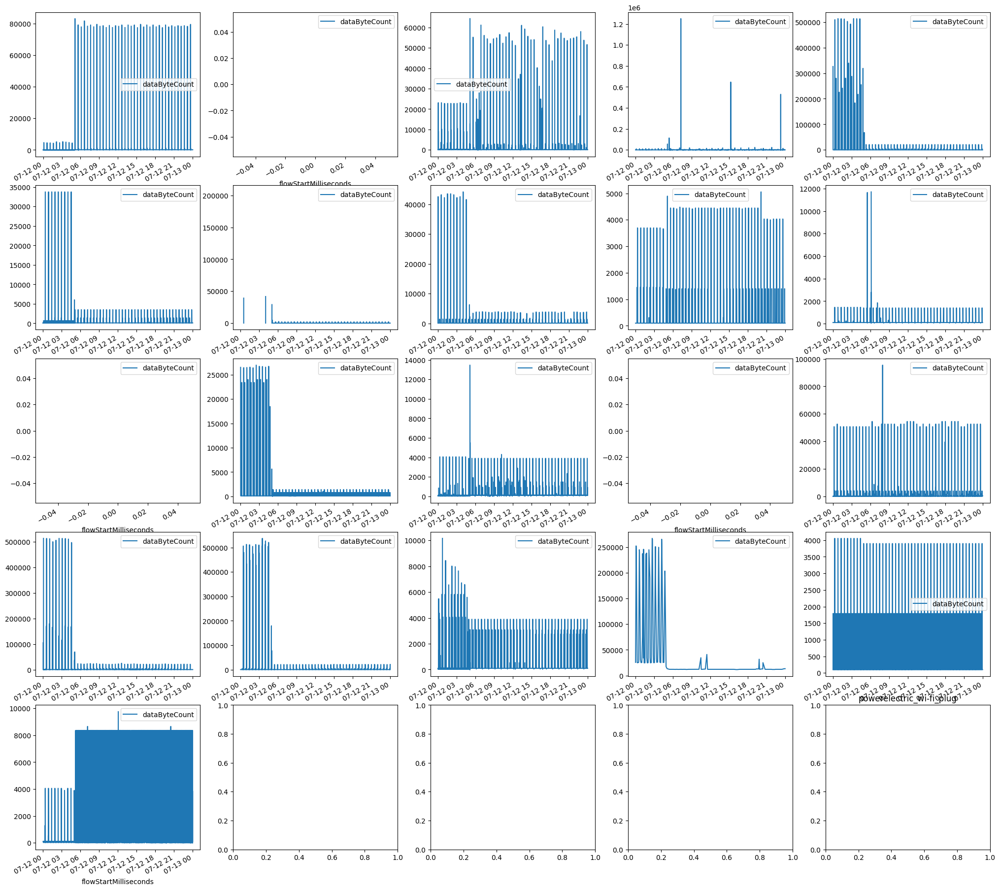

In [40]:
day_df = df[(df['flowStartMilliseconds'] > '2019-07-12') & (df['flowStartMilliseconds'] < '2019-07-13')]

## TO DO: Investigate databyteCount behaviour to find spikes in activity
fig, axes = plt.subplots(nrows=5,ncols=5, figsize=(25,25))
i = 0
devices = month_df['Device'].unique()
for device in devices:
    # print("\n", device, "\n")
    time_df = day_df[day_df["Device"] == device][["flowStartMilliseconds", 'dataByteCount']]
    # time_df
    time_df.plot(x="flowStartMilliseconds", y='dataByteCount', ax=axes[i//5, i%5])
    plt.title(device)
    i += 1
plt.show()

  ## Clearly distinct patterns for each device, particularly with w